IMPORTING LIBRARIES

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import datetime as dt
import os
import warnings
warnings.filterwarnings('ignore')

from scipy.stats import zscore
from sklearn.preprocessing import PowerTransformer, LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score, r2_score, classification_report, confusion_matrix, roc_curve, plot_roc_curve
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, BaggingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn import metrics, datasets, model_selection
from imblearn.over_sampling import SMOTE

In [2]:
hr= pd.read_csv('https://raw.githubusercontent.com/ANANYAJENA/Datasets/master/HR%20Analytics.csv')
hr

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,0,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,1,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,0,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,0,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,0,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,0,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,0,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


In [3]:
hr.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,0,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,1,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,0,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,0,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [4]:
# EDA

hr.shape

(1470, 35)

In [5]:
hr.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [6]:
hr.dtypes

Age                          int64
Attrition                    int64
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
Over18                      object
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears   

Above looking the above output, some of the columns in the data are object type and remaining all are integer datatype

In [7]:
# Checking the info

hr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   int64 
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [8]:
# Checking unique values

hr.nunique()

Age                           43
Attrition                      2
BusinessTravel                 3
DailyRate                    886
Department                     3
DistanceFromHome              29
Education                      5
EducationField                 6
EmployeeCount                  1
EmployeeNumber              1470
EnvironmentSatisfaction        4
Gender                         2
HourlyRate                    71
JobInvolvement                 4
JobLevel                       5
JobRole                        9
JobSatisfaction                4
MaritalStatus                  3
MonthlyIncome               1349
MonthlyRate                 1427
NumCompaniesWorked            10
Over18                         1
OverTime                       2
PercentSalaryHike             15
PerformanceRating              2
RelationshipSatisfaction       4
StandardHours                  1
StockOptionLevel               4
TotalWorkingYears             40
TrainingTimesLastYear          7
WorkLifeBa

In [9]:
# Dropping irrelevant columns

hr.drop(columns=["EmployeeCount", "Over18", "StandardHours", "EmployeeNumber"], axis=1, inplace= True)

In [10]:
hr.shape

(1470, 31)

In [11]:
# Checking null values

hr.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSinceLastPromotion     0
YearsWithCurrManager        0
dtype: int64

There is no missing values in the dataset

<AxesSubplot:>

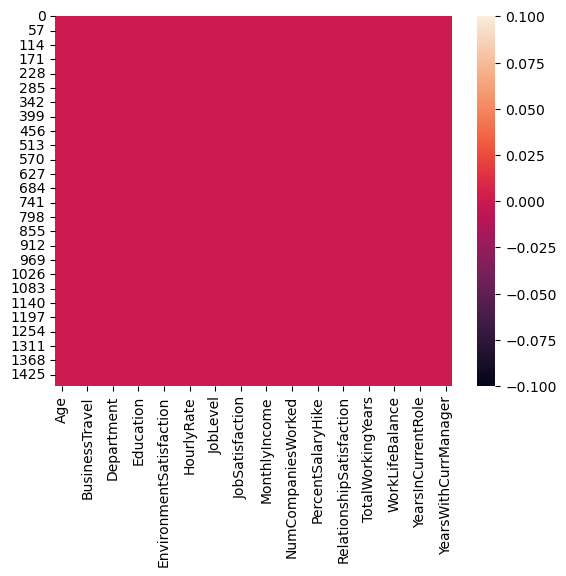

In [12]:
# Visualizing the null values

sns.heatmap(hr.isnull())

After visualizing, there is no missing values. So, our data is clean

In [13]:
# Checking uniqueness of the data

hr['Attrition'].unique()

array([1, 0], dtype=int64)

There are two unique values in the label '1' which is also considers as 'yes' or '0' which is also considers as 'no'. If we say yes or 1 that means the employees is facing attrition and no or 0 means employees are not facing any attrition. 

In [14]:
# Checking the counts of employees who stayed and left the company

hr['Attrition'].value_counts()

0    1233
1     237
Name: Attrition, dtype: int64

By above data, we can see that 237 employees are facing attrition and 1233 employees are not facing attition.

In [15]:
hr.loc[hr['Attrition']==" "]

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager


In [16]:
# Describing the dataset

hr.describe()

,Age,Attrition,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,0.161224,802.485714,9.192517,2.912925,2.721769,65.891156,2.729932,2.063946,2.728571,...,3.153741,2.712245,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,0.367863,403.509100,8.106864,1.024165,1.093082,20.329428,0.711561,1.106940,1.102846,...,0.360824,1.081209,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,0.000000,102.000000,1.000000,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,...,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,0.000000,465.000000,2.000000,2.000000,2.000000,48.000000,2.000000,1.000000,2.000000,...,3.000000,2.000000,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,0.000000,802.000000,7.000000,3.000000,3.000000,66.000000,3.000000,2.000000,3.000000,...,3.000000,3.000000,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,0.000000,1157.000000,14.000000,4.000000,4.000000,83.750000,3.000000,3.000000,4.000000,...,3.000000,4.000000,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1.000000,1499.000000,29.000000,5.000000,4.000000,100.000000,4.000000,5.000000,4.000000,...,4.000000,4.000000,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


This is the statistical information of the dataset

From the above description we are observing following points:

1. There are no missing values present in the data.

2. The mean is more than the median in most of the columns which means they are right skewed.

3. In few columns, the median is more than the mean which means they are left skewed.

4. Some of the columns have too differences in mean and the standard deviation.

5. Let's separate categorical and numerical columns.

In [17]:
# Checking the categorical columns

categorical_col=[]
for i in hr.dtypes.index:
    if hr.dtypes[i]== 'object':
        categorical_col.append(i)
print(categorical_col)

['BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus', 'OverTime']


In [18]:
# Checking numerical columns

numerical_col=[]
for i in hr.dtypes.index:
    if hr.dtypes[i]!= 'object':
        numerical_col.append(i)
print(numerical_col)

['Age', 'Attrition', 'DailyRate', 'DistanceFromHome', 'Education', 'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']


# DATA VISUALIZATION

### UNIVARIATE ANALYSIS

PLOTTING CATEGORICAL COLUMNS

0    1233
1     237
Name: Attrition, dtype: int64


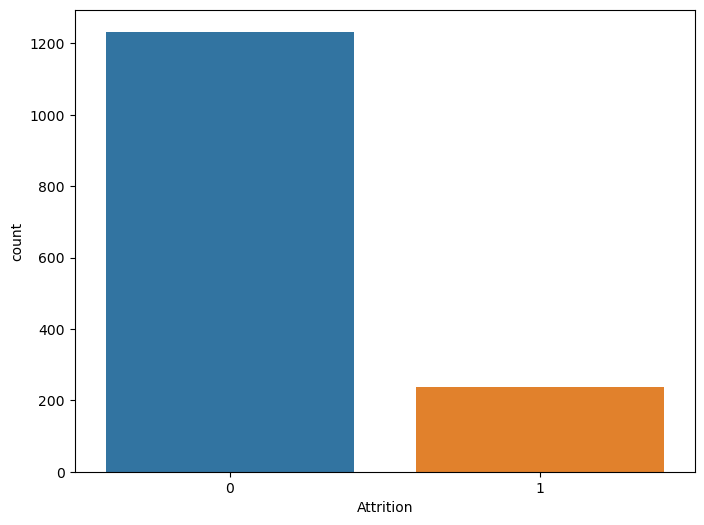

In [19]:
# Visualizing employees who stayed or left the company

print(hr["Attrition"].value_counts())
plt.figure(figsize=(8,6))
sns.countplot(hr["Attrition"])
plt.show()

The data is very imbalanced. So, we will balance the data before model building.

Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64


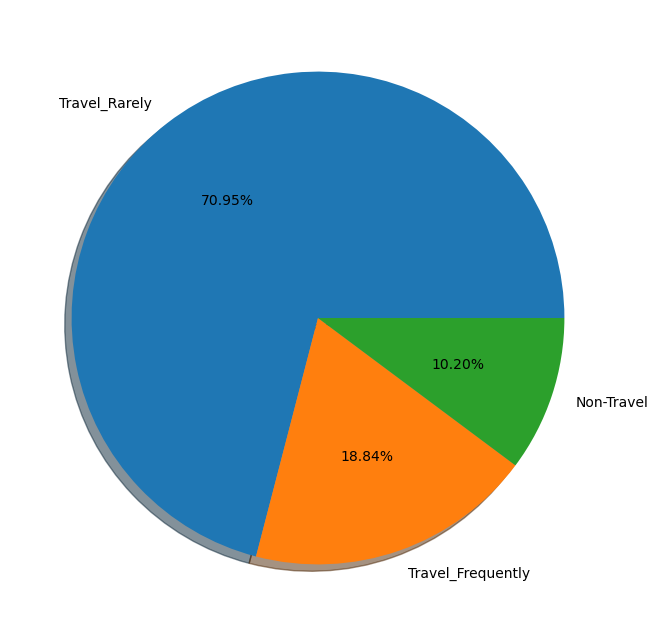

In [20]:
# Basis of BusinessTravel

print(hr["BusinessTravel"].value_counts())
labels= 'Travel_Rarely', 'Travel_Frequently', 'Non-Travel'
fig, ax= plt.subplots(figsize=(12,8))
ax.pie(hr['BusinessTravel'].value_counts(), labels=labels, autopct= '%1.2f%%', shadow= True)
plt.show()

The pie plot shows that most of the employees travel rarely and few employees travel frequently.

Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64


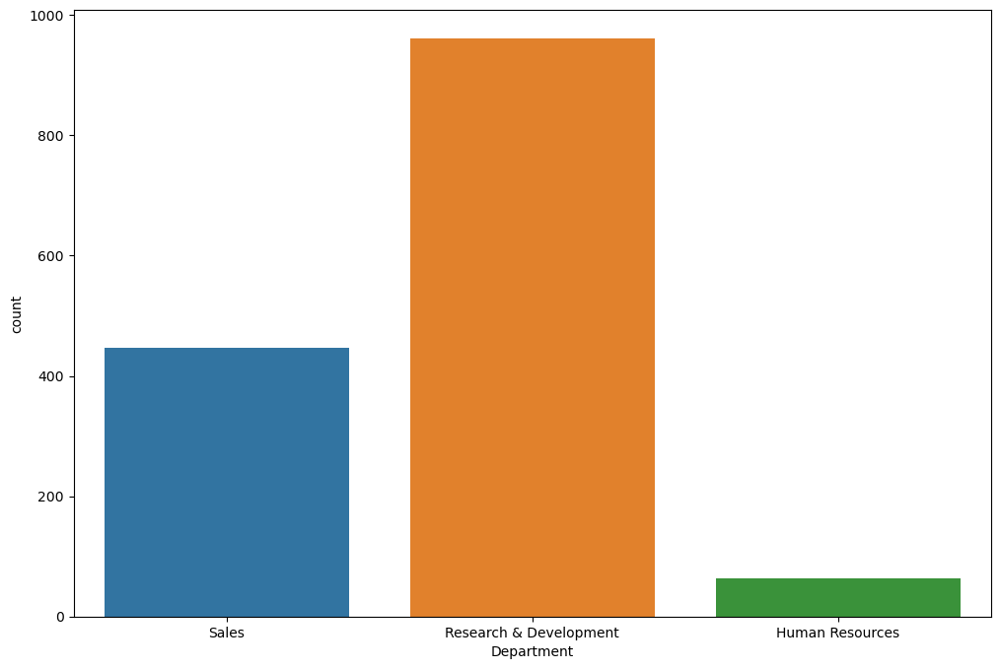

In [21]:
# Count of dept where the employees are working

print(hr["Department"].value_counts())
plt.figure(figsize=(12,8))
sns.countplot(hr["Department"])
plt.show()

Most of the employees belongs to Research and Development dept and 446 are working in the Sales dept and remaining 63 emploees works in HR dept.

Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: EducationField, dtype: int64


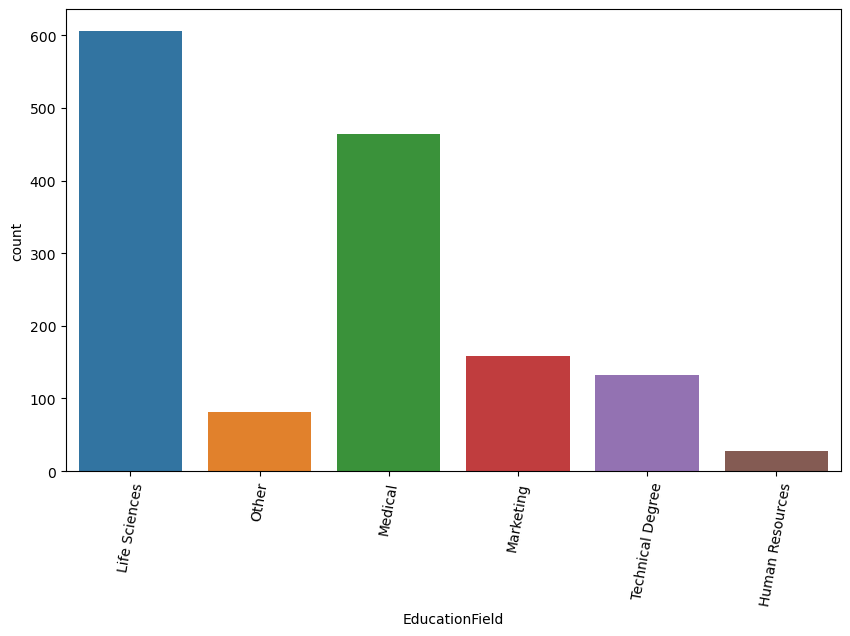

In [22]:
# Count of Educational field

print(hr["EducationField"].value_counts())
plt.figure(figsize=(10,6))
sns.countplot(hr["EducationField"])
plt.xticks(rotation=80)
plt.show()

Here most of the employees are from the Life Science background by Medical field and only few employees are from HR field.

Male      882
Female    588
Name: Gender, dtype: int64


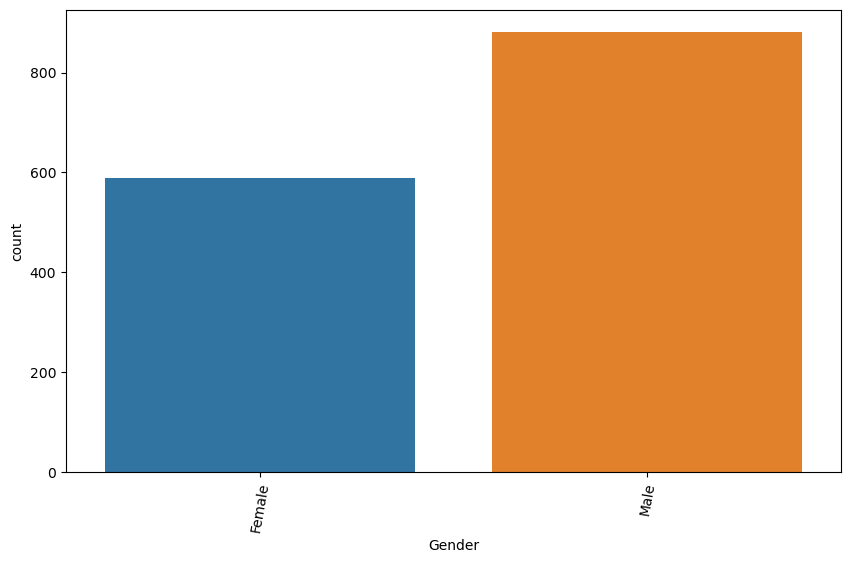

In [23]:
# Count of Gender

print(hr["Gender"].value_counts())
plt.figure(figsize=(10,6))
sns.countplot(hr["Gender"])
plt.xticks(rotation=80)
plt.show()

Male employees are facing more Attrition than the female employees.

Sales Executive              326
Research Scientist           292
Laboratory Technician        259
Manufacturing Director       145
Healthcare Representative    131
Manager                      102
Sales Representative          83
Research Director             80
Human Resources               52
Name: JobRole, dtype: int64


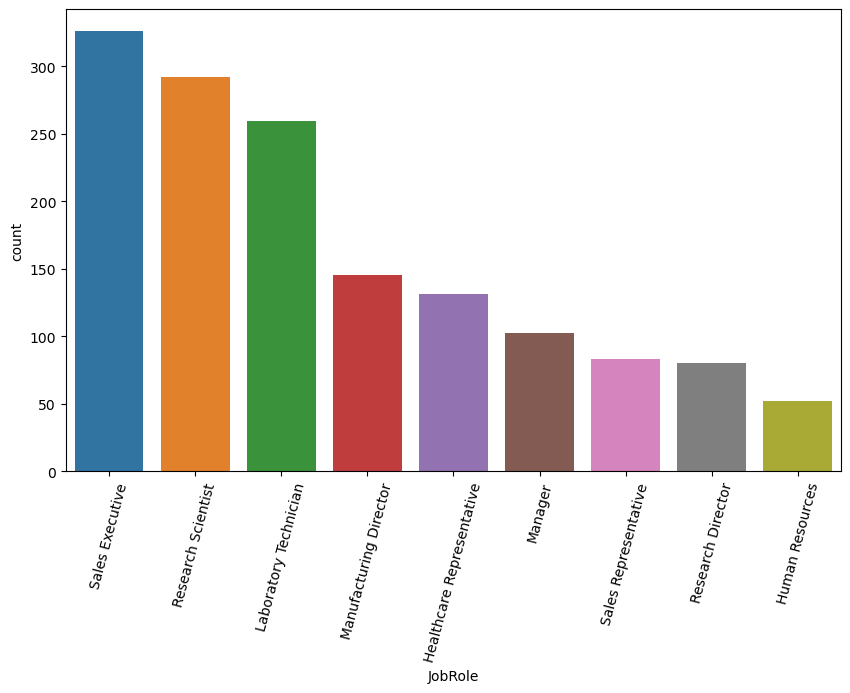

In [24]:
# Count of Job Role

print(hr["JobRole"].value_counts())
plt.figure(figsize=(10,6))
sns.countplot(hr["JobRole"])
plt.xticks(rotation=75)
plt.show()

Sales Executive jobs are followed by Research Scientist and Lab Technician. HR job roles are very less in numbers.

Married     673
Single      470
Divorced    327
Name: MaritalStatus, dtype: int64


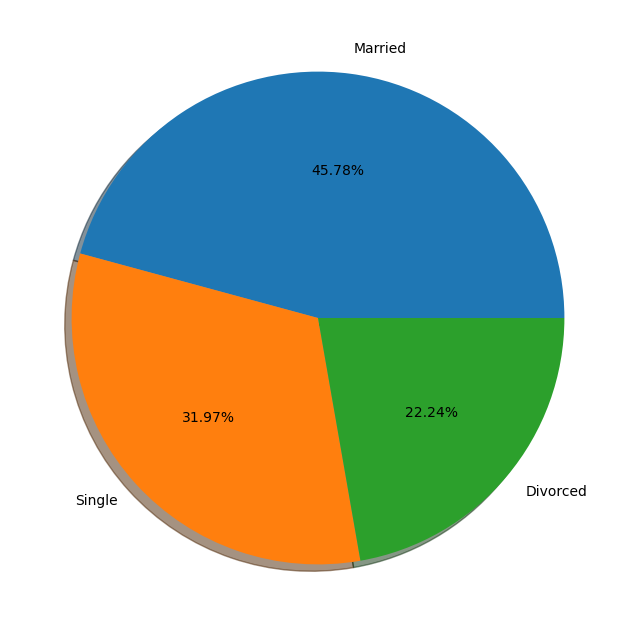

In [25]:
# Basis of Marial status 

print(hr["MaritalStatus"].value_counts())
labels= 'Married', 'Single', 'Divorced'
fig, ax= plt.subplots(figsize=(12,8))
ax.pie(hr['MaritalStatus'].value_counts(), labels=labels, autopct= '%1.2f%%', shadow= True)
plt.show()

There are around 45% of employees who are married, around 32% are single remaining around 22% are divorced. So, the married employees are more than the others.

No     1054
Yes     416
Name: OverTime, dtype: int64


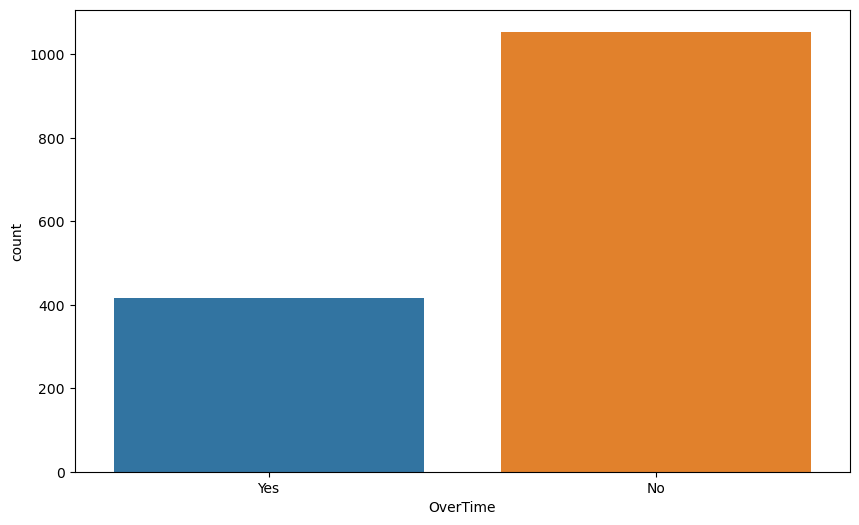

In [26]:
# Count of Over Time

print(hr["OverTime"].value_counts())
plt.figure(figsize=(10,6))
sns.countplot(hr["OverTime"])
plt.show()

# DISTRIBUTION OF SKEWNESS

### PLOTTING NUMERICAL COLUMNS

In [27]:
numerical_columns= ['Age', 'DailyRate', 'DiatanceFromHome', 'Education', 'Environment', '']

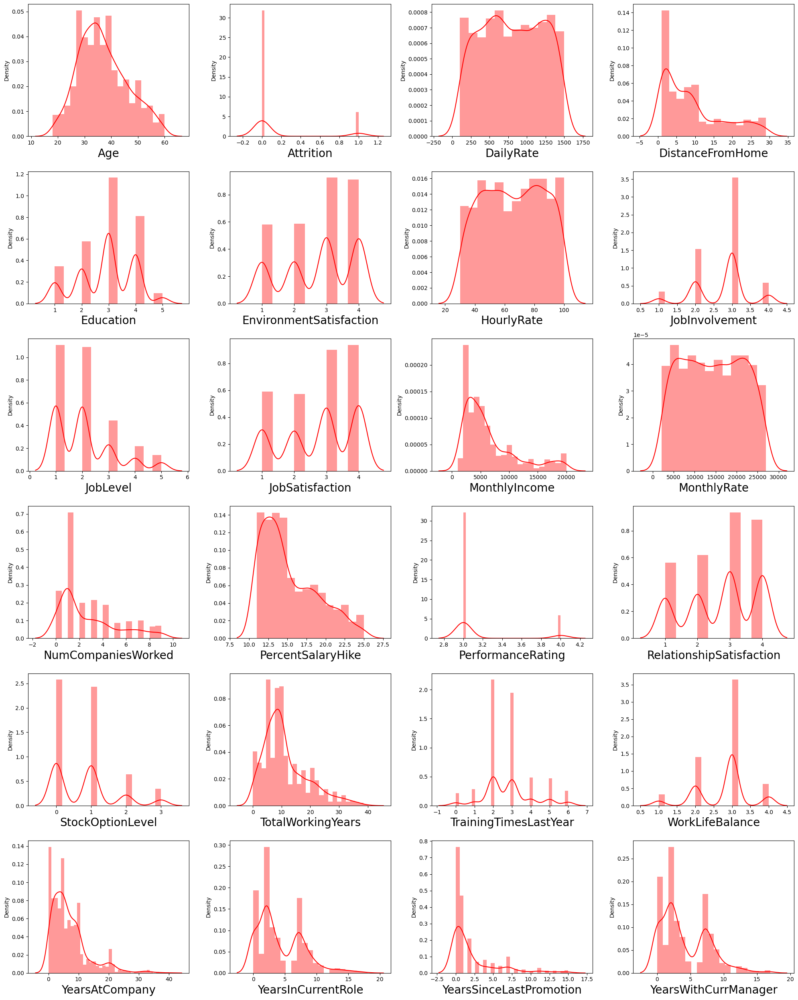

In [28]:
# Checking the distributed data in each column

plt.figure(figsize=(20,25), facecolor= 'white')
plotnumber=1
for column in numerical_col:
    if plotnumber <=24:
        ax= plt.subplot(6,4,plotnumber)
        sns.distplot(hr[column],color='r')
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.tight_layout()

Except age, dailyrate, hourlyrate and monthlyrate all the other columns in numerical columns list are skewed. 

## BIVARIATE ANALYSIS

ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

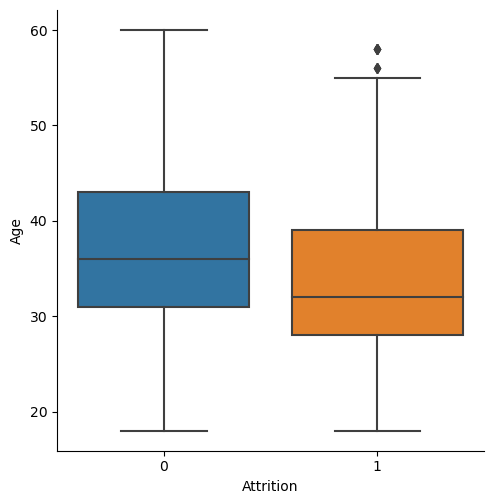

In [29]:
# Age of employees who left and stayed

sns.catplot(hr['Attrition'], hr['Age'], data= hr, kind= "box", size=5);
plt.title('Comparison between Attrition and Age')

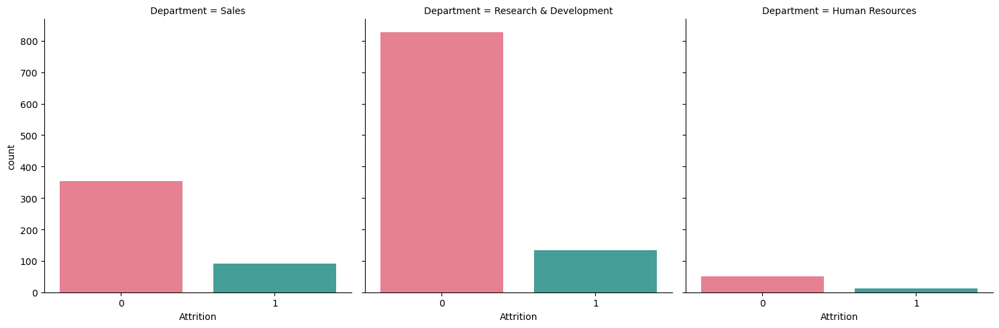

In [30]:
# Department

sns.catplot(x= 'Attrition', col= 'Department', data= hr, kind= 'count', palette= "husl")

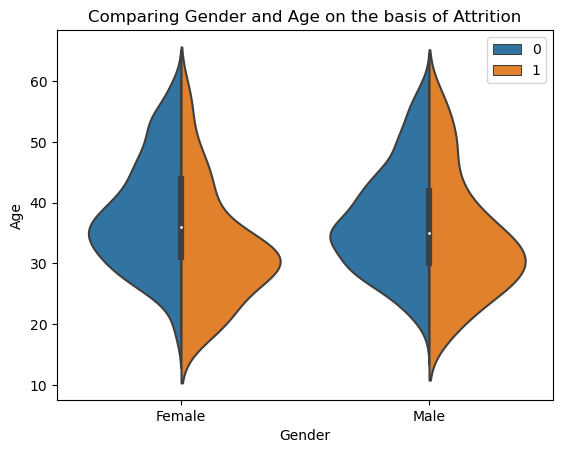

In [31]:
# Gender
# Checking the attrition plays role in gender and age

sns.violinplot(x= hr['Gender'], y= hr['Age'], hue= hr["Attrition"], split= True)
plt.title("Comparing Gender and Age on the basis of Attrition")
plt.legend()
plt.show()

It is clearly shown in the graph that the female employess of age more than 30 years upto 40 wants to leave the company but the male employees of age 25-40 do not wants to leave the company.

Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64


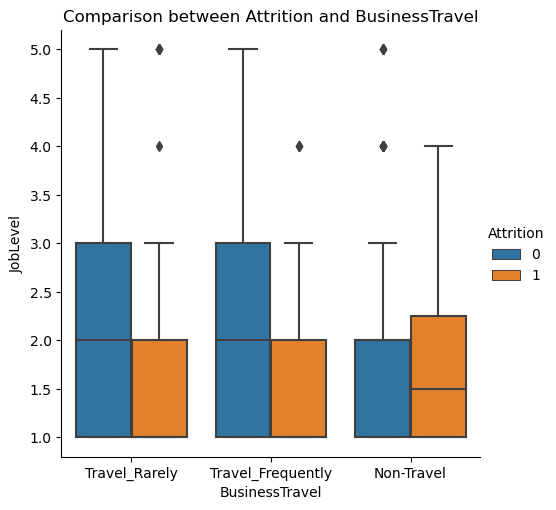

In [32]:
# Business Travel

print(hr["BusinessTravel"].value_counts())
sns.catplot(x= "BusinessTravel", y='JobLevel', data=hr, hue= "Attrition", kind= "box")
plt.title("Comparison between Attrition and BusinessTravel")
plt.show()

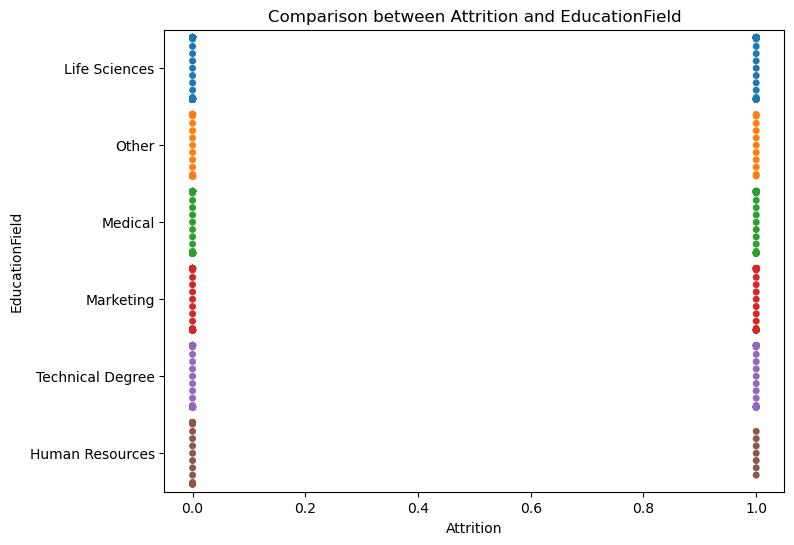

In [33]:
# Checking the attrition performing according to the employees Education Field

plt.figure(figsize=(8,6))
plt.title("Comparison between Attrition and EducationField")
sns.swarmplot(x=hr['Attrition'], y= hr['EducationField'], data=hr)
plt.show()

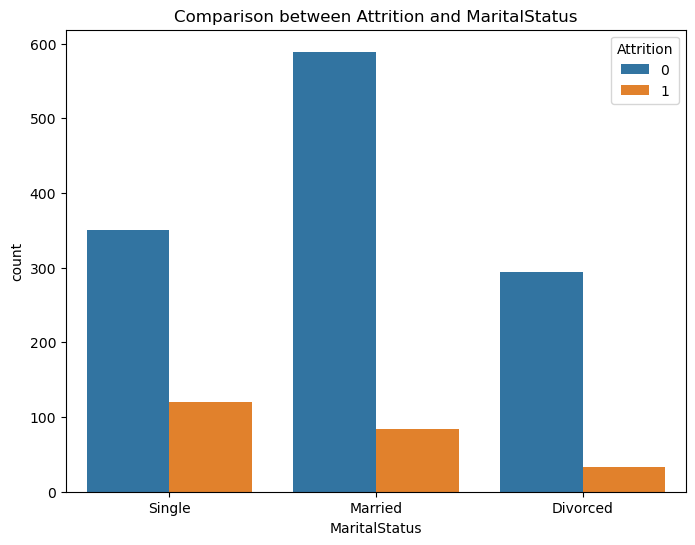

In [34]:
# Checking the attrition performing according to the employees Marital Status

plt.figure(figsize=(8,6))
plt.title("Comparison between Attrition and MaritalStatus")
sns.countplot(x=hr['MaritalStatus'], hue= hr['Attrition'], data=hr)
plt.show()

The attrition is higher in single than married or divorced.

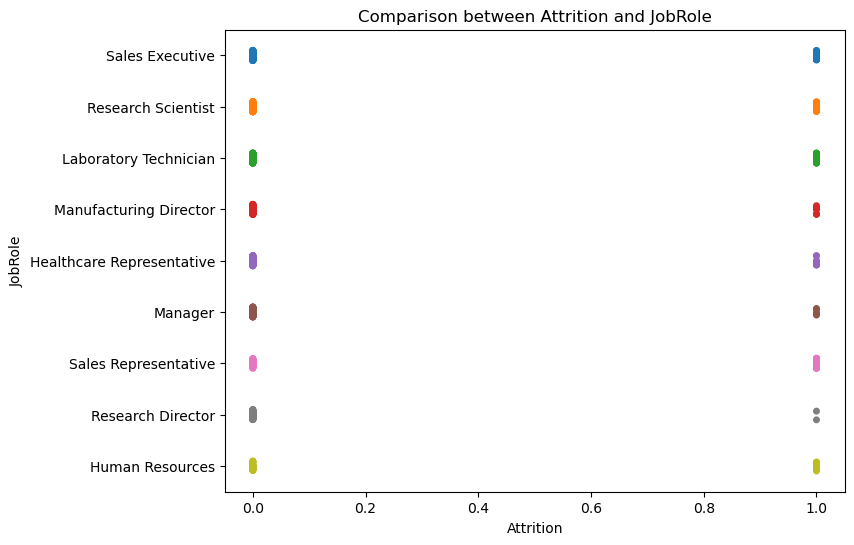

In [35]:
# Checking the attrition performing according to the employees Job Role

plt.figure(figsize=(8,6))
plt.title("Comparison between Attrition and JobRole")
sns.stripplot(x=hr['Attrition'], y= hr['JobRole'])
plt.show()

### DailyRate and HourlyRate, MonthlyRate and MonthlyIncome

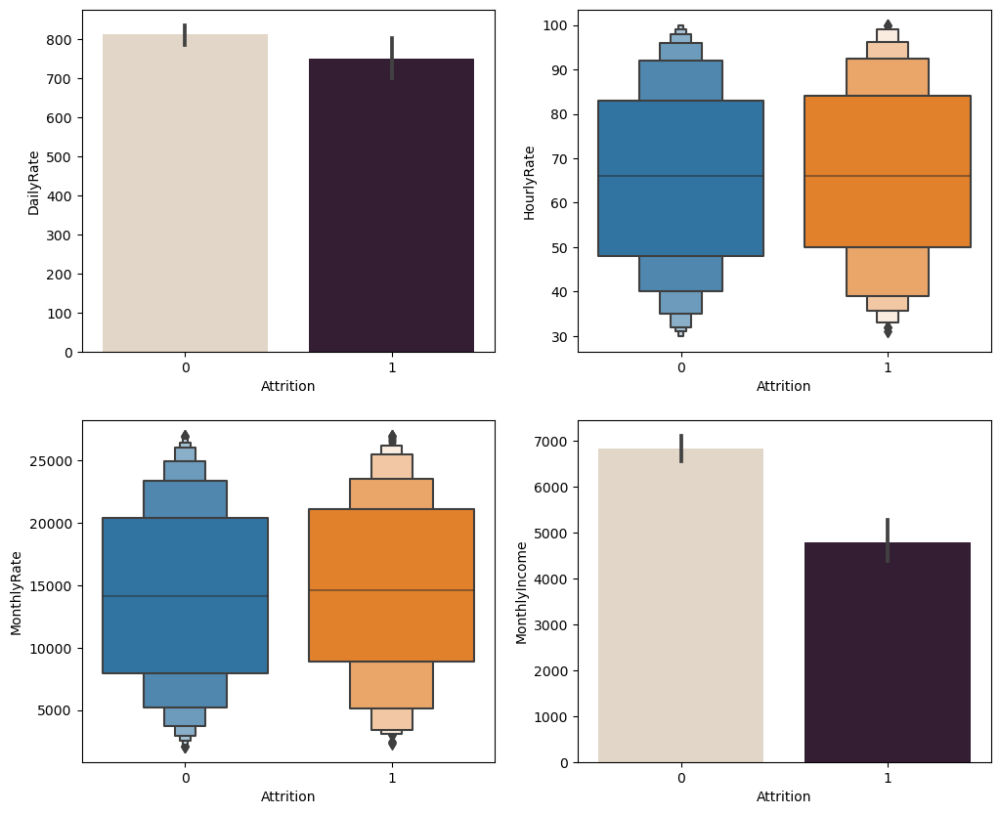

In [36]:
fig, axes= plt.subplots(2,2,figsize=(12,10))

# Checking attrition in DailyRate
sns.barplot(x='Attrition', y='DailyRate', ax= axes[0,0], data= hr, palette= "ch:.25")

# Checking attrition in HourlyRate
sns.boxenplot(x='Attrition', y='HourlyRate', ax= axes[0,1], data= hr)

# Checking attrition in MonthlyRate
sns.boxenplot(x='Attrition', y='MonthlyRate', ax= axes[1,0], data= hr)

# Checking attrition in MonthlyIncome
sns.barplot(x='Attrition', y='MonthlyIncome', ax= axes[1,1], data= hr, palette= "ch:.25")
plt.show()

Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: EducationField, dtype: int64


ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

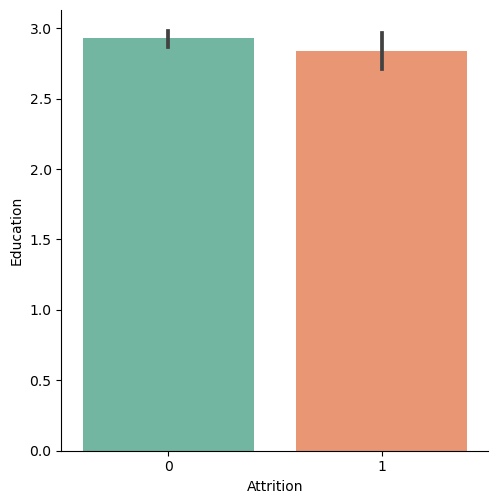

In [37]:
# Checking the attrition effecting the education of employees

print(hr["EducationField"].value_counts())
sns.catplot(hr['Attrition'], hr['Education'], data=hr, kind= "bar", palette= "Set2")
plt.title("Comparison between Attrition and Education")
plt.show()

### EnvironmentSatisfaction, JobInvolvement, JobSatisfaction And RelationshipSatisfaction

In [38]:
print(hr["EnvironmentSatisfaction"].value_counts())

3    453
4    446
2    287
1    284
Name: EnvironmentSatisfaction, dtype: int64


In [39]:
print(hr["JobInvolvement"].value_counts())

3    868
2    375
4    144
1     83
Name: JobInvolvement, dtype: int64


In [40]:
print(hr["JobSatisfaction"].value_counts())

4    459
3    442
1    289
2    280
Name: JobSatisfaction, dtype: int64


In [41]:
print(hr["RelationshipSatisfaction"].value_counts())

3    459
4    432
2    303
1    276
Name: RelationshipSatisfaction, dtype: int64


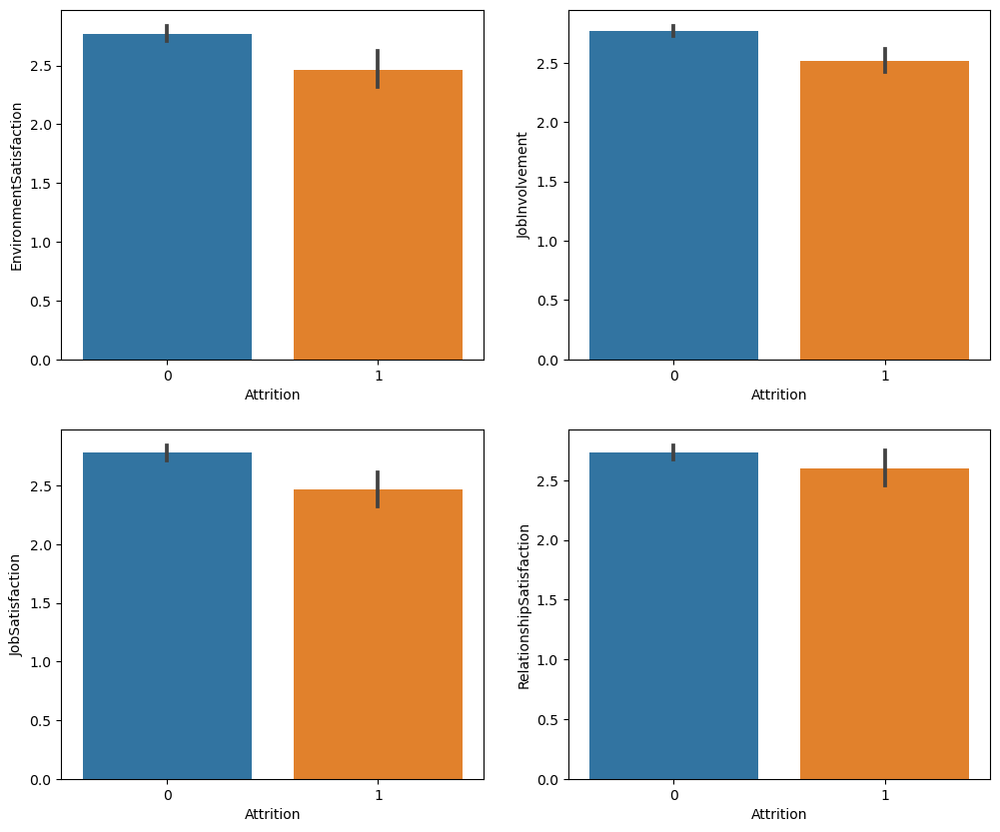

In [42]:
fig, axes= plt.subplots(2,2,figsize=(12,10))

sns.barplot(x='Attrition', y='EnvironmentSatisfaction', ax= axes[0,0], data=hr)

sns.barplot(x='Attrition', y='JobInvolvement', ax= axes[0,1], data=hr)

sns.barplot(x='Attrition', y='JobSatisfaction', ax= axes[1,0], data=hr)

sns.barplot(x='Attrition', y='RelationshipSatisfaction', ax= axes[1,1], data=hr)
plt.show()

3    893
2    344
4    153
1     80
Name: WorkLifeBalance, dtype: int64


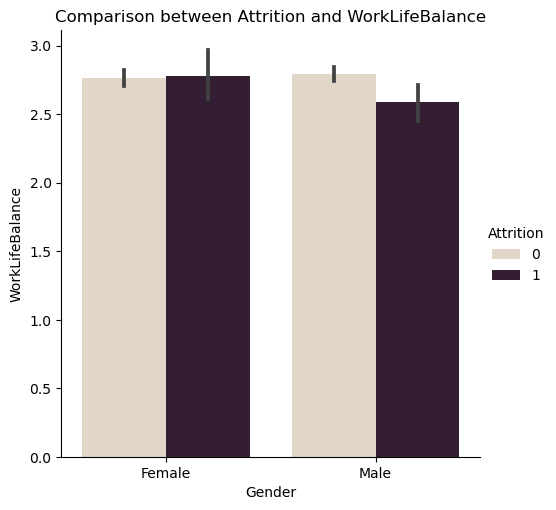

In [43]:
# Checking attrition in WorkLifeBalance

print(hr["WorkLifeBalance"].value_counts())
sns.catplot(x='Gender', y='WorkLifeBalance', data=hr, kind= "bar", hue= 'Attrition', palette= "ch:.25")
plt.title("Comparison between Attrition and WorkLifeBalance")
plt.show()

The female employees with bad work life balance facing more attrition compare to more male employees.

### YearsAtComapny, TotalWorkingYears, YearsInCurrentRole And YearsSinceLastPromotion

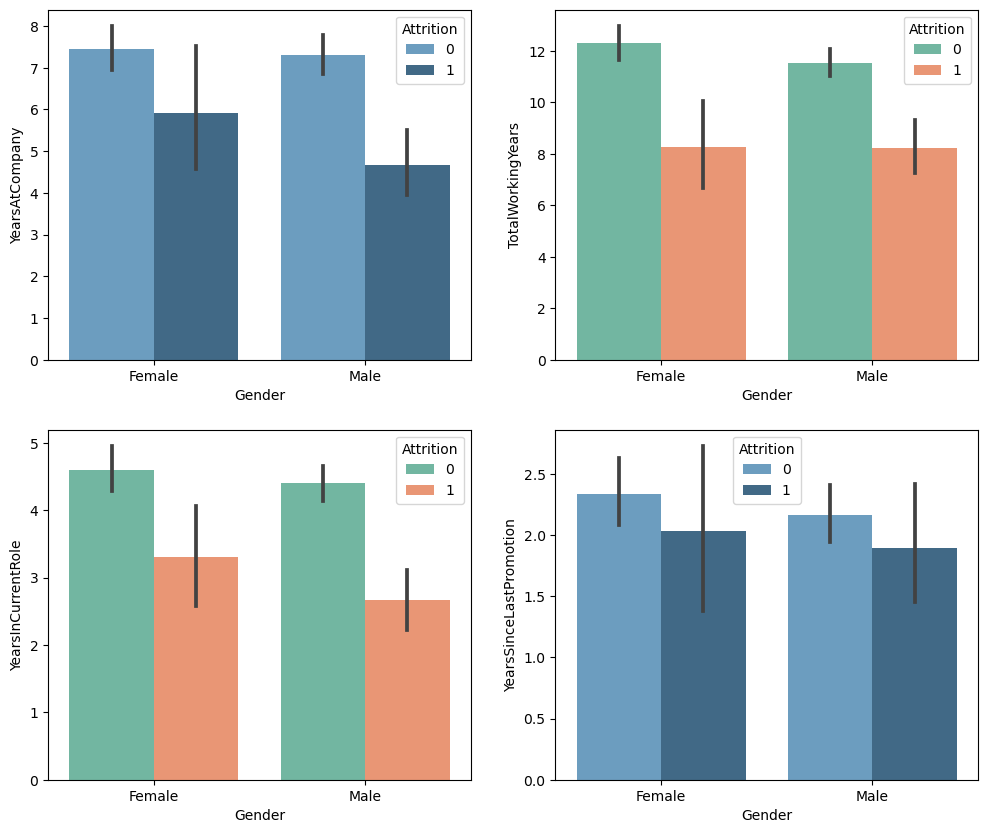

In [44]:
fig, axes= plt.subplots(2,2,figsize=(12,10))

sns.barplot(x='Gender', y='YearsAtCompany', ax= axes[0,0], data=hr, hue= 'Attrition', palette= "Blues_d")

sns.barplot(x= 'Gender', y='TotalWorkingYears', ax= axes[0,1], data=hr, hue= 'Attrition', palette= "Set2")

sns.barplot(x='Gender', y='YearsInCurrentRole', ax= axes[1,0], data=hr, hue= 'Attrition', palette= "Set2")

sns.barplot(x='Gender', y='YearsSinceLastPromotion', ax= axes[1,1], data=hr, hue= 'Attrition', palette= "Blues_d")
plt.show()

Observation:
    
1. Female employees are spending more years at company but the 'Yes' attrition for female employees are more than male in the 1st plot.
2. As same as above the Total Working Years of female employees is more than the male employees in the 2nd plot.
3. Here also the female employees spending more years in the current company compare to male employees.
4. The female employees spend more years their last promotion than male employees.

## Performance Rating

3    1244
4     226
Name: PerformanceRating, dtype: int64


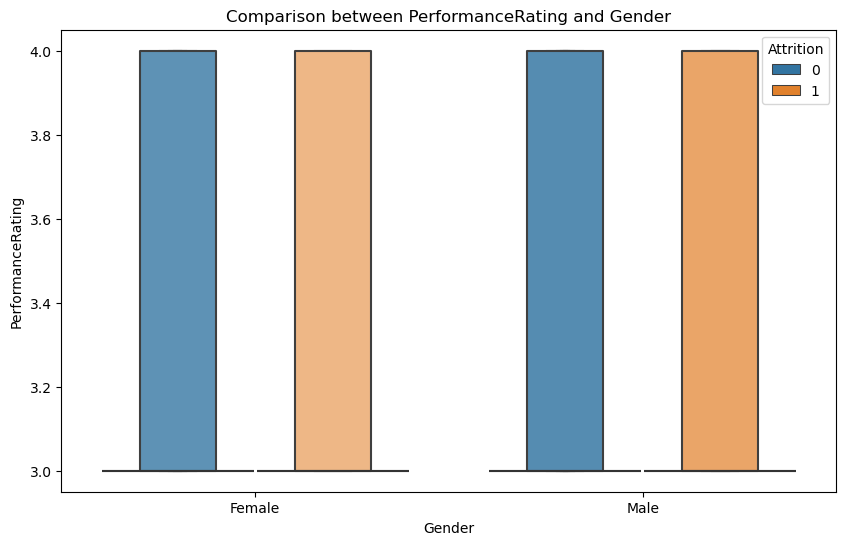

In [47]:
# Checking the performance rating affecting the attrition

print(hr["PerformanceRating"].value_counts())
plt.figure(figsize=(10,6))
sns.boxenplot(hr['Gender'], hr['PerformanceRating'], data=hr, hue= hr['Attrition'])
plt.title("Comparison between PerformanceRating and Gender")
plt.show()

## Percent Salary Hike

11    210
13    209
14    201
12    198
15    101
18     89
17     82
16     78
19     76
22     56
20     55
21     48
23     28
24     21
25     18
Name: PercentSalaryHike, dtype: int64


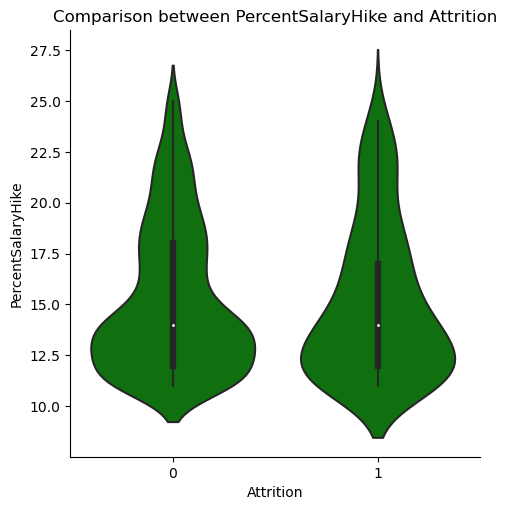

In [48]:
# Checking the attrition affecting the PercentSalaryHike

print(hr["PercentSalaryHike"].value_counts())
sns.catplot(x='Attrition', y='PercentSalaryHike', data=hr, kind= "violin", color="g")
plt.title("Comparison between PercentSalaryHike and Attrition")
plt.show()

There is no such Difference in Attrition and PercentSalaryHike, they both seems to be equal, means the PercentSalaryHike won't affect the attrition.

### PerformanceRating, TrainingTimeLastYear NumCompWorked

In [49]:
# Checking the count of the column
print(hr["TrainingTimesLastYear"].value_counts())

2    547
3    491
4    123
5    119
1     71
6     65
0     54
Name: TrainingTimesLastYear, dtype: int64


In [50]:
# Checking the count of the column
print(hr["PerformanceRating"].value_counts())

3    1244
4     226
Name: PerformanceRating, dtype: int64


In [51]:
# Checking the count of the column
print(hr["NumCompaniesWorked"].value_counts())

1    521
0    197
3    159
2    146
4    139
7     74
6     70
5     63
9     52
8     49
Name: NumCompaniesWorked, dtype: int64


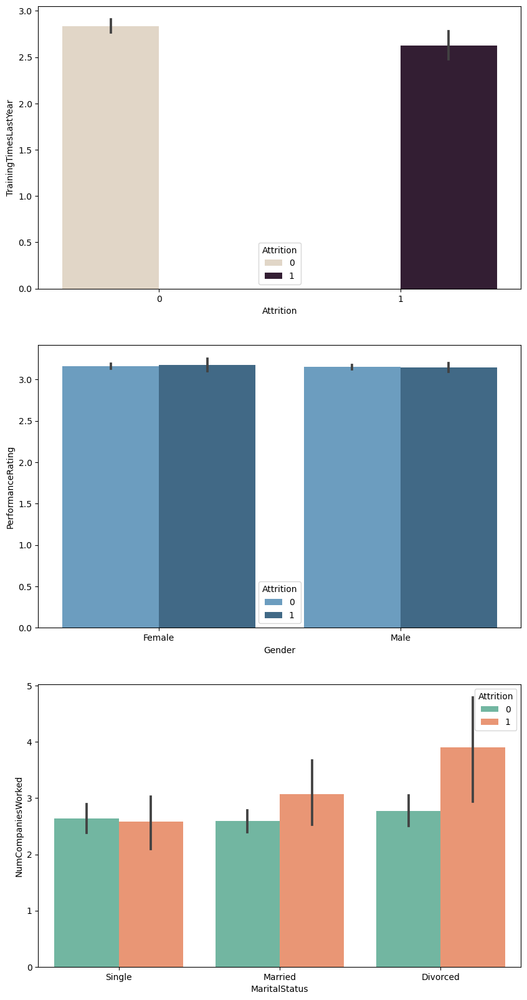

In [53]:
fig, axes= plt.subplots(3,1,figsize=(10,20))

sns.barplot(x='Attrition', y='TrainingTimesLastYear', ax= axes[0], data=hr, hue= 'Attrition', palette= "ch:.25")

sns.barplot(x= 'Gender', y='PerformanceRating', ax= axes[1], data=hr, hue= 'Attrition', palette= "Blues_d")

sns.barplot(x='MaritalStatus', y='NumCompaniesWorked', ax= axes[2], data=hr, hue= 'Attrition', palette= "Set2")
plt.show()

### YearsWithCurrentManager

2     344
0     263
7     216
3     142
8     107
4      98
1      76
9      64
5      31
6      29
10     27
11     22
12     18
13     14
17      7
15      5
14      5
16      2
Name: YearsWithCurrManager, dtype: int64


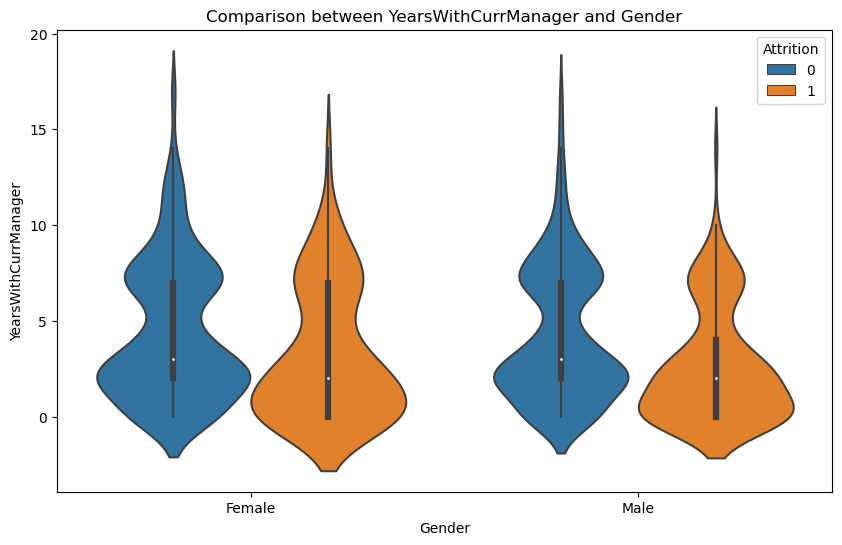

In [55]:
# Checking the performance rating affecting the attrition

print(hr["YearsWithCurrManager"].value_counts())
plt.figure(figsize=(10,6))
sns.violinplot(hr['Gender'], hr['YearsWithCurrManager'], data=hr, hue= hr['Attrition'])
plt.title("Comparison between YearsWithCurrManager and Gender")
plt.show()

## MULTIVARIATE ANALYSIS

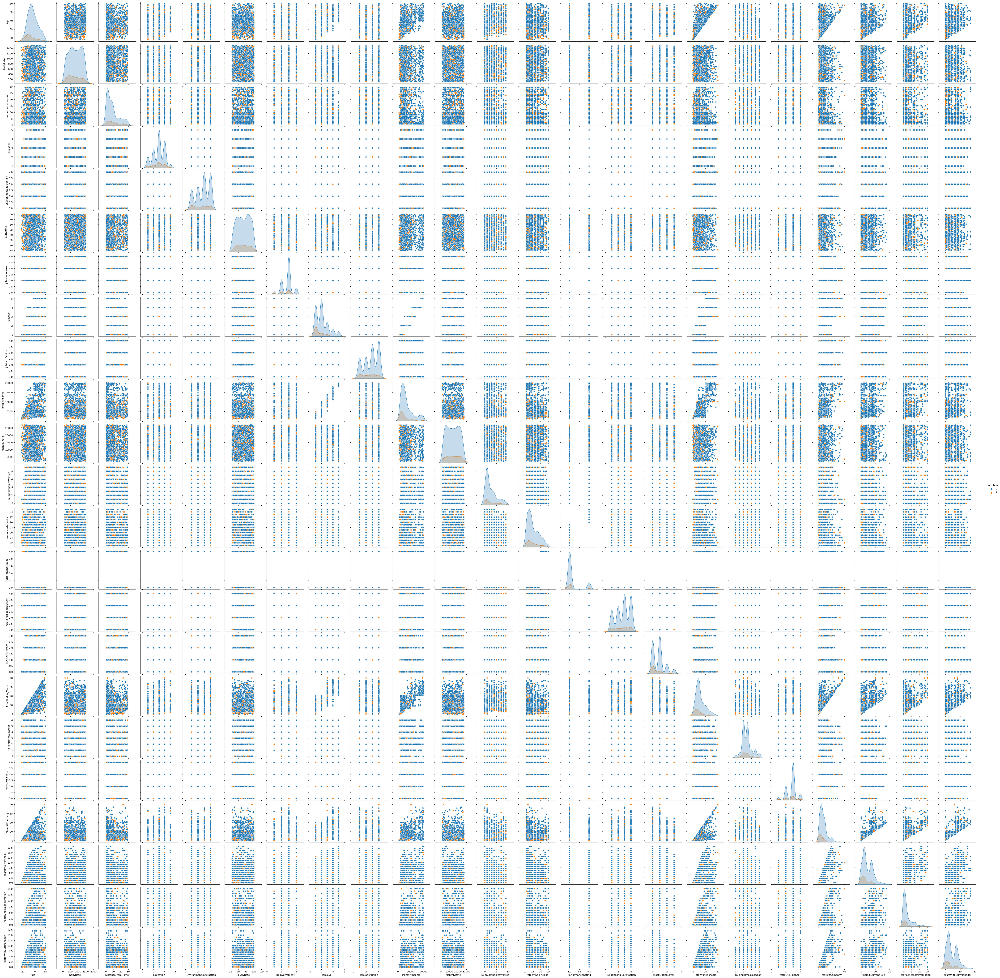

In [56]:
# Checking the pairwise relation in the dataset
sns.pairplot(hr, hue= "Attrition")

Observation:
    
1. This pair plot gives the pairwise relationship between the columns which is plotted on the basis of target variable 'Attrition'. Here we can observe the relation between the features and label.
2. Some of the features have strong linear relationship and most of the features are highly correlated with each other.
3. Some of the features have outliers and skewness.

### Identifying the Outliers

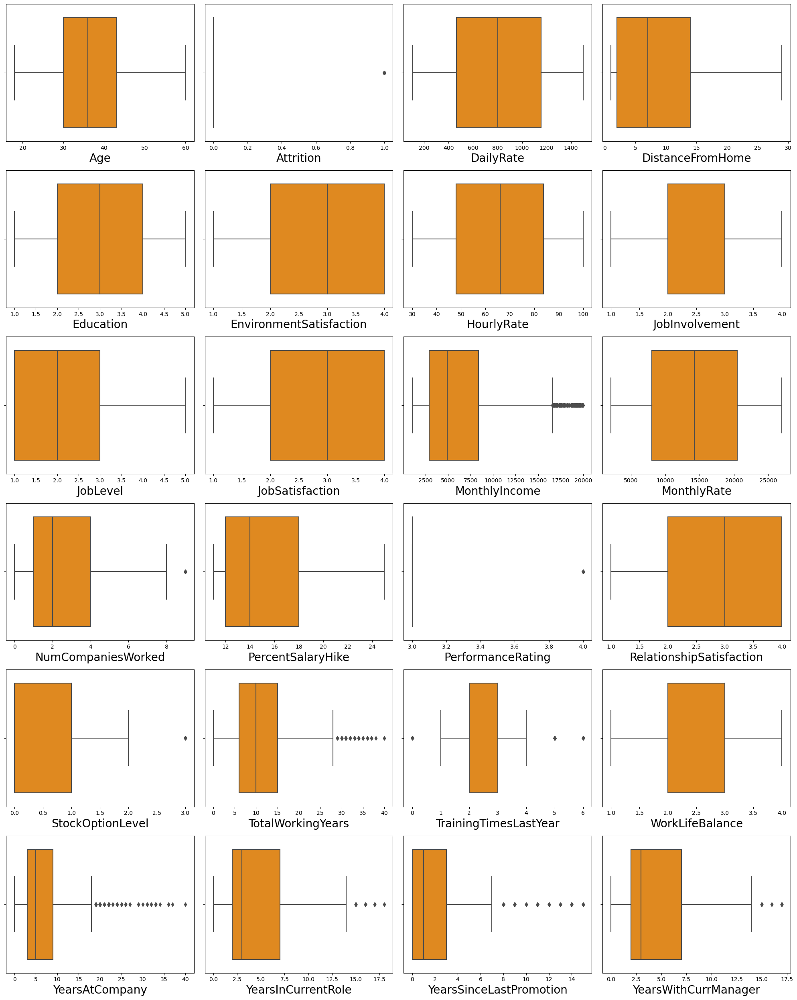

In [57]:
plt.figure(figsize=(20,25), facecolor= 'white')
plotnumber=1
for column in numerical_col:
    if plotnumber <=24:
        ax= plt.subplot(6,4,plotnumber)
        sns.boxplot(hr[column], color= "darkorange")
        plt.xlabel(column, fontsize=20)
    plotnumber+=1
plt.tight_layout()

Outliers present in the columns MonthlyIncome, NumCompaniesWorked, PerformanceRating, StockOptionLevel, TotalWorkingYears, TrainingTimesLastYears, YearsAtCompany, YearsInCurrentRole, YearsSinceLastPromotion and YearsWithCurrManager. We will remove these outliers further. 

### Removing Outliers

In [58]:
hr.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

In [59]:
# now checking for numerical columns

numerical_col= []
for i in hr.dtypes.index:
    if hr.dtypes[i]!= 'object':
        numerical_col.append(i)
print(numerical_col)

['Age', 'Attrition', 'DailyRate', 'DistanceFromHome', 'Education', 'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']


### ZScore Method

In [62]:
# Features containing outliers
features= hr[['MonthlyIncome', 'NumCompaniesWorked', 'PerformanceRating', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear','YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']]

In [63]:
# Using ZScore to remove outliers
z= np.abs(zscore(features))
z

,MonthlyIncome,NumCompaniesWorked,PerformanceRating,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0.108350,2.125136,0.426230,0.932014,0.421642,2.171982,0.164613,0.063296,0.679146,0.245834
1,0.291719,0.678049,2.346151,0.241988,0.164511,0.155707,0.488508,0.764998,0.368715,0.806541
2,0.937654,1.324226,0.426230,0.932014,0.550208,0.155707,1.144294,1.167687,0.679146,1.155935
3,0.763634,0.678049,0.426230,0.932014,0.421642,0.155707,0.161947,0.764998,0.252146,1.155935
4,0.644858,2.525591,0.426230,0.241988,0.678774,0.155707,0.817734,0.615492,0.058285,0.595227
...,...,...,...,...,...,...,...,...,...,...
1465,0.835451,0.523316,0.426230,0.241988,0.735447,0.155707,0.327893,0.615492,0.679146,0.314873
1466,0.741140,0.523316,0.426230,0.241988,0.293077,1.707500,0.001333,0.764998,0.368715,0.806541
1467,0.076690,0.678049,2.346151,0.241988,0.678774,2.171982,0.164613,0.615492,0.679146,0.314873
1468,0.236474,0.277594,0.426230,0.932014,0.735447,0.155707,0.325228,0.488900,0.679146,1.086895


In [64]:
# Creating nre dataframe

hr_new= hr[(z<3).all(axis=1)]
hr_new

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,...,3,1,0,8,0,1,6,4,0,5
1,49,0,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,...,4,4,1,10,3,3,10,7,1,7
2,37,1,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,...,3,2,0,7,3,3,0,0,0,0
3,33,0,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,...,3,3,0,8,3,3,8,7,3,0
4,27,0,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,...,3,4,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0,Travel_Frequently,884,Research & Development,23,2,Medical,3,Male,...,3,3,1,17,3,3,5,2,0,3
1466,39,0,Travel_Rarely,613,Research & Development,6,1,Medical,4,Male,...,3,1,1,9,5,3,7,7,1,7
1467,27,0,Travel_Rarely,155,Research & Development,4,3,Life Sciences,2,Male,...,4,2,1,6,0,3,6,2,0,3
1468,49,0,Travel_Frequently,1023,Sales,2,3,Medical,4,Male,...,3,4,0,17,3,2,9,6,0,8


In [65]:
# Shape of original dataset
hr.shape

(1470, 31)

In [66]:
# Shape of new dataframe
hr_new.shape

(1387, 31)

In [67]:
# Checking the data loss
data_loss= (1470-1387)/1470*100
data_loss

5.646258503401361

## IQR Method

In [68]:
# 1st Quantile
Q1= features.quantile(0.25)

# 3rd Quantile
Q3= features.quantile(0.75)

# IQR
IQR= Q3-Q1
hr1= hr[~((hr<(Q1-1.5*IQR)) | (hr> (Q3 +1.5*IQR))).any(axis=1)]

In [69]:
hr1.shape

(779, 31)

In [70]:
# Let's check the dataloss
data_loss= (1470-779)/1470*100
data_loss

47.006802721088434

Using IQR method I am losing 47% of data

### Checking the Skewness

In [71]:
hr_new.skew()

Age                         0.472280
Attrition                   1.805983
DailyRate                  -0.017078
DistanceFromHome            0.954752
Education                  -0.289024
EnvironmentSatisfaction    -0.325285
HourlyRate                 -0.030481
JobInvolvement             -0.501401
JobLevel                    1.126075
JobSatisfaction            -0.345612
MonthlyIncome               1.544770
MonthlyRate                 0.030596
NumCompaniesWorked          1.037715
PercentSalaryHike           0.800592
PerformanceRating           1.931566
RelationshipSatisfaction   -0.295686
StockOptionLevel            0.962332
TotalWorkingYears           1.034487
TrainingTimesLastYear       0.577614
WorkLifeBalance            -0.557100
YearsAtCompany              1.248623
YearsInCurrentRole          0.726675
YearsSinceLastPromotion     1.756335
YearsWithCurrManager        0.694506
dtype: float64

### Removing Skewness

In [74]:
skew= ['DistanceFromHome', 'JobLevel', 'MonthlyIncome', 'NumCompaniesWorked', 'PercentSalaryHike', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsWithCurrManager']

scaler= PowerTransformer(method= 'yeo-johnson')
'''
parameters:
method= 'box-cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod= 'box-cox' or 'yeo-johnson'\n"

In [75]:
hr_new[skew]= scaler.fit_transform(hr_new[skew].values)
hr_new[skew].head()

,DistanceFromHome,JobLevel,MonthlyIncome,NumCompaniesWorked,PercentSalaryHike,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsInCurrentRole,YearsWithCurrManager
0,-1.489968,0.349828,0.386674,1.620671,-1.495549,-1.084263,-0.173231,-2.608524,0.231837,0.290524,0.582177
1,0.244561,0.349828,0.144235,-0.561880,1.690425,0.548653,0.147620,0.217074,0.948319,1.006575,1.018073
2,-1.028366,-1.141761,-1.431153,1.273711,0.193797,-1.084263,-0.351153,0.217074,-2.156089,-1.571814,-1.528426
3,-0.698191,-1.141761,-0.814425,-0.561880,-1.495549,-1.084263,-0.173231,0.217074,0.621429,1.006575,-1.528426
4,-1.028366,-1.141761,-0.504453,1.764103,-0.957525,0.548653,-0.544046,0.217074,-0.933983,-0.390769,-0.347871


In [76]:
hr_new.skew()

Age                         0.472280
Attrition                   1.805983
DailyRate                  -0.017078
DistanceFromHome           -0.008149
Education                  -0.289024
EnvironmentSatisfaction    -0.325285
HourlyRate                 -0.030481
JobInvolvement             -0.501401
JobLevel                    0.110769
JobSatisfaction            -0.345612
MonthlyIncome               0.027700
MonthlyRate                 0.030596
NumCompaniesWorked          0.016175
PercentSalaryHike           0.112128
PerformanceRating           1.931566
RelationshipSatisfaction   -0.295686
StockOptionLevel            0.089929
TotalWorkingYears          -0.009666
TrainingTimesLastYear       0.057949
WorkLifeBalance            -0.557100
YearsAtCompany             -0.025230
YearsInCurrentRole         -0.069631
YearsSinceLastPromotion     1.756335
YearsWithCurrManager       -0.070570
dtype: float64

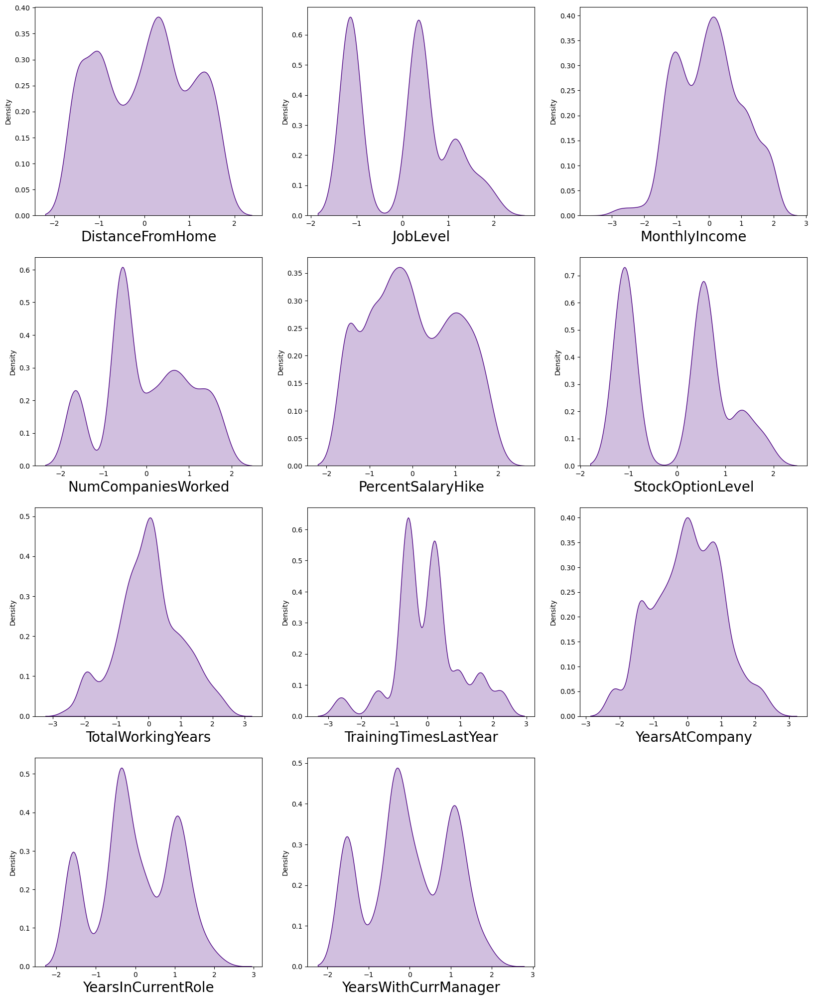

In [77]:
plt.figure(figsize=(20,25), facecolor= 'white')
plotnumber=1

for column in hr_new[skew]:
    if plotnumber <=12:
        ax= plt.subplot(4,3,plotnumber)
        sns.distplot(hr_new[column], color= 'indigo', kde_kws= {"shade": True}, hist= False)
        plt.xlabel(column, fontsize=20)
    plotnumber +=1
plt.show()

This looks normal compared to the old data and the skewness is also reduced. Now our data is cleaned.

## Label Encoder

In [78]:
categorical_col= ['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus', 'OverTime']

In [80]:
le= LabelEncoder()
hr_new[categorical_col]= hr_new[categorical_col].apply(le.fit_transform)
hr_new[categorical_col]

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,OverTime
0,1,2,2,1,0,7,2,1
1,0,1,1,1,1,6,1,0
2,1,2,1,4,1,2,2,1
3,0,1,1,1,0,6,1,1
4,0,2,1,3,1,2,1,0
...,...,...,...,...,...,...,...,...
1465,0,1,1,3,1,2,1,0
1466,0,2,1,3,1,0,1,0
1467,0,2,1,1,1,4,1,1
1468,0,1,2,3,1,7,1,0


## Correlation

In [81]:
# Checking the correlation between the features and the target
cor= hr_new.corr()
cor

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,-0.159366,0.022340,0.021946,-0.038242,-0.028793,0.198502,-0.032676,0.014098,-0.039430,...,-0.000617,0.041744,0.077833,0.634884,-0.013707,-0.016913,0.174149,0.118454,0.103632,0.114962
Attrition,-0.159366,1.000000,-0.001041,-0.057220,0.063637,0.080979,-0.032703,0.023585,-0.112393,0.036252,...,0.010781,-0.052344,-0.175081,-0.220878,-0.059071,-0.062492,-0.201954,-0.187047,-0.029263,-0.186821
BusinessTravel,0.022340,-0.001041,1.000000,-0.004606,-0.003521,-0.015034,-0.010560,0.022576,0.001183,-0.025364,...,-0.018274,-0.029660,-0.012732,0.031888,0.011688,-0.014140,-0.021107,-0.032472,-0.027283,-0.033222
DailyRate,0.021946,-0.057220,-0.004606,1.000000,-0.005398,-0.003967,-0.018442,0.040645,0.033123,-0.005242,...,0.000574,0.004516,0.047773,0.043307,0.006581,-0.044266,0.005806,0.020542,-0.043870,0.007098
Department,-0.038242,0.063637,-0.003521,-0.005398,1.000000,0.037660,0.012846,0.013432,-0.014540,-0.030618,...,-0.039364,-0.037705,-0.001271,-0.007789,0.039412,0.026978,0.026334,0.057983,0.048931,0.023995
DistanceFromHome,-0.028793,0.080979,-0.015034,-0.003967,0.037660,1.000000,0.003595,0.011891,-0.012075,0.010557,...,0.013212,0.010099,0.027082,-0.012129,-0.015334,-0.027681,0.006570,0.013091,-0.003226,-0.002310
Education,0.198502,-0.032703,-0.010560,-0.018442,0.012846,0.003595,1.000000,-0.038017,-0.026223,-0.019166,...,-0.023487,-0.002393,0.026805,0.152263,-0.023484,0.007844,0.038266,0.050563,0.042517,0.026340
EducationField,-0.032676,0.023585,0.022576,0.040645,0.013432,0.011891,-0.038017,1.000000,0.047924,0.010676,...,-0.003621,-0.013734,-0.017331,-0.008101,0.048844,0.034038,0.002739,0.002909,0.034094,0.025918
EnvironmentSatisfaction,0.014098,-0.112393,0.001183,0.033123,-0.014540,-0.012075,-0.026223,0.047924,1.000000,-0.015715,...,-0.025299,0.018414,0.025227,-0.014091,-0.016757,0.032492,0.014305,0.031007,0.027943,0.007643
Gender,-0.039430,0.036252,-0.025364,-0.005242,-0.030618,0.010557,-0.019166,0.010676,-0.015715,1.000000,...,-0.010757,0.041458,0.024390,-0.049776,-0.039213,0.000134,-0.046018,-0.028101,-0.028162,-0.027972


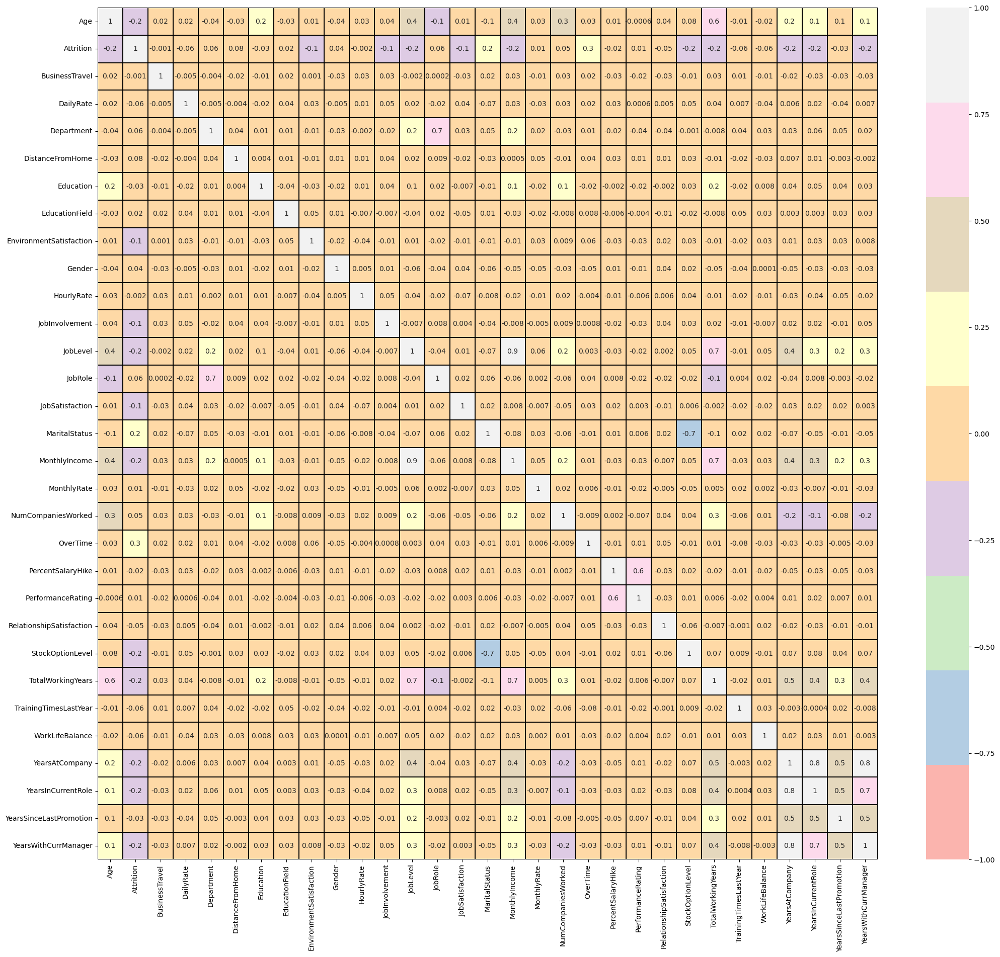

In [83]:
# Visualizing the correlation matrix 
plt.figure(figsize=(25,22))
sns.heatmap(hr_new.corr(), linewidths=.1, vmin=-1, vmax=1, fmt='.1g', annot= True, linecolor= "black", annot_kws= {'size':10}, cmap= "Pastel1")
plt.yticks(rotation=0);

In [84]:
cor['Attrition'].sort_values(ascending= False)

Attrition                   1.000000
OverTime                    0.257237
MaritalStatus               0.160960
DistanceFromHome            0.080979
JobRole                     0.064283
Department                  0.063637
NumCompaniesWorked          0.047508
Gender                      0.036252
EducationField              0.023585
MonthlyRate                 0.014888
PerformanceRating           0.010781
BusinessTravel             -0.001041
HourlyRate                 -0.001532
PercentSalaryHike          -0.017523
YearsSinceLastPromotion    -0.029263
Education                  -0.032703
RelationshipSatisfaction   -0.052344
DailyRate                  -0.057220
TrainingTimesLastYear      -0.059071
WorkLifeBalance            -0.062492
EnvironmentSatisfaction    -0.112393
JobSatisfaction            -0.114206
JobInvolvement             -0.133957
Age                        -0.159366
StockOptionLevel           -0.175081
YearsWithCurrManager       -0.186821
YearsInCurrentRole         -0.187047
J

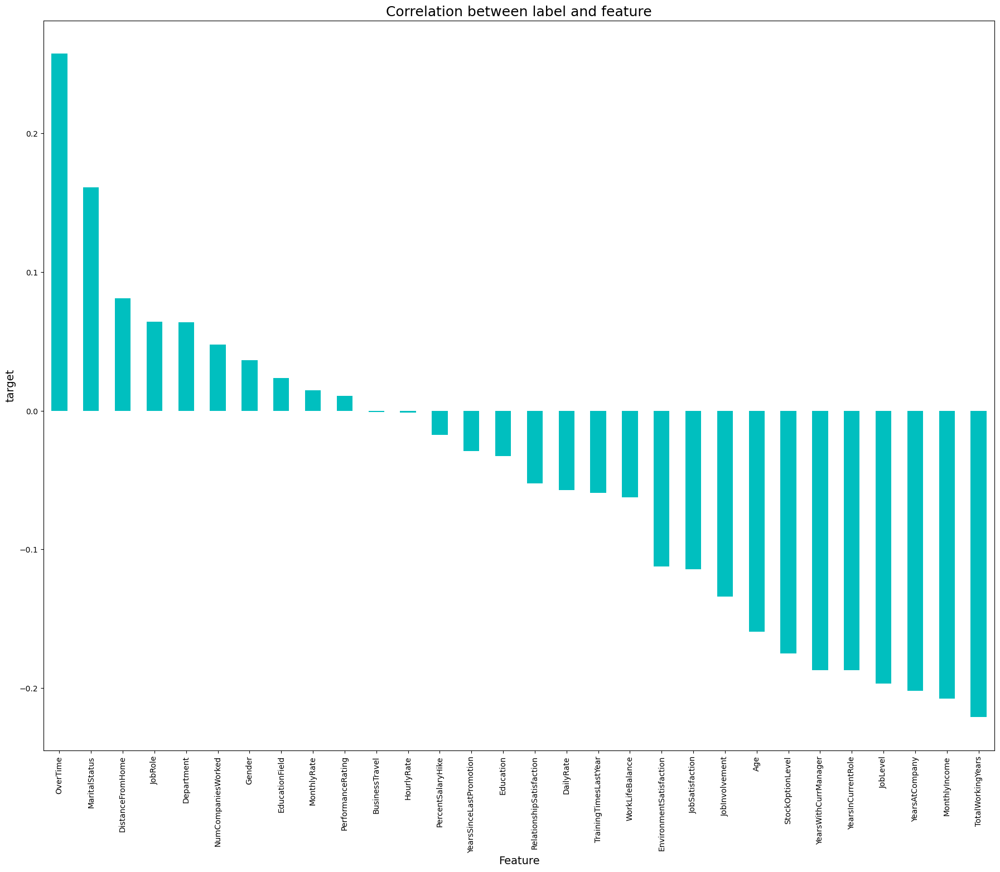

In [85]:
# Visualizing the correlation between label and features

plt.figure(figsize=(22,17))
hr_new.corr()['Attrition'].sort_values(ascending= False).drop(['Attrition']).plot(kind= 'bar', color= 'c')
plt.xlabel('Feature', fontsize=14)
plt.ylabel('target', fontsize=14)
plt.title('Correlation between label and feature', fontsize=18)
plt.show()

### Dropping irrelevant columns

In [88]:
hr_new.drop("BusinessTravel", axis=1, inplace= True) 
hr_new.drop("HourlyRate", axis=1, inplace= True)
hr_new.head()

,Age,Attrition,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,JobInvolvement,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,1102,2,-1.489968,2,1,2,0,3,...,3,1,-1.084263,-0.173231,-2.608524,1,0.231837,0.290524,0,0.582177
1,49,0,279,1,0.244561,1,1,3,1,2,...,4,4,0.548653,0.147620,0.217074,3,0.948319,1.006575,1,1.018073
2,37,1,1373,1,-1.028366,2,4,4,1,2,...,3,2,-1.084263,-0.351153,0.217074,3,-2.156089,-1.571814,0,-1.528426
3,33,0,1392,1,-0.698191,4,1,4,0,3,...,3,3,-1.084263,-0.173231,0.217074,3,0.621429,1.006575,3,-1.528426
4,27,0,591,1,-1.028366,1,3,1,1,3,...,3,4,0.548653,-0.544046,0.217074,3,-0.933983,-0.390769,2,-0.347871


In [89]:
# Separating the features and label variables

x= hr_new.drop("Attrition", axis=1)
y= hr_new["Attrition"]

In [90]:
x.shape

(1387, 28)

In [91]:
y.shape

(1387,)

In [92]:
x.head()

,Age,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,JobInvolvement,JobLevel,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1102,2,-1.489968,2,1,2,0,3,0.349828,...,3,1,-1.084263,-0.173231,-2.608524,1,0.231837,0.290524,0,0.582177
1,49,279,1,0.244561,1,1,3,1,2,0.349828,...,4,4,0.548653,0.147620,0.217074,3,0.948319,1.006575,1,1.018073
2,37,1373,1,-1.028366,2,4,4,1,2,-1.141761,...,3,2,-1.084263,-0.351153,0.217074,3,-2.156089,-1.571814,0,-1.528426
3,33,1392,1,-0.698191,4,1,4,0,3,-1.141761,...,3,3,-1.084263,-0.173231,0.217074,3,0.621429,1.006575,3,-1.528426
4,27,591,1,-1.028366,1,3,1,1,3,-1.141761,...,3,4,0.548653,-0.544046,0.217074,3,-0.933983,-0.390769,2,-0.347871


In [93]:
y.value_counts()

0    1158
1     229
Name: Attrition, dtype: int64

## Oversampling

In [94]:
sm= SMOTE()
x,y= sm.fit_resample(x,y)

In [95]:
y.value_counts()

1    1158
0    1158
Name: Attrition, dtype: int64

<AxesSubplot:xlabel='Attrition', ylabel='count'>

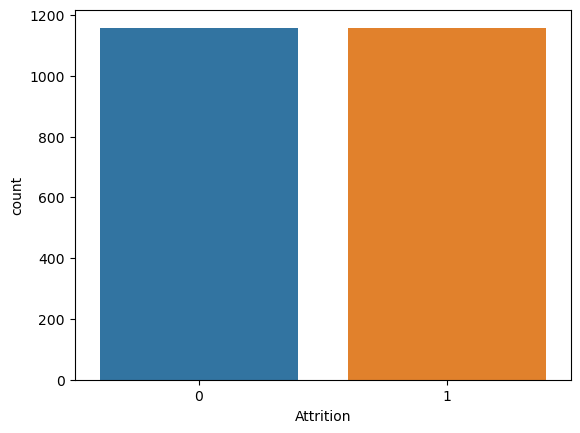

In [96]:
sns.countplot(y)

## StandardScaler

In [97]:
ss= StandardScaler()
x= pd.DataFrame(ss.fit_transform(x), columns= x.columns)
x

,Age,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,JobInvolvement,JobLevel,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0.729056,0.814681,1.614232,-1.644781,-0.775097,-0.906855,-0.429729,-1.038747,0.646617,0.569288,...,-0.333653,-1.428457,-0.959856,0.020759,-2.677720,-2.144107,0.440973,0.497145,-0.672251,0.789703
1,1.671032,-1.295729,-0.349298,0.204051,-1.823650,-0.906855,0.496087,0.962699,-0.714806,0.569288,...,2.997125,1.433400,0.750276,0.353935,0.290349,0.547357,1.186647,1.259347,-0.233925,1.246634
2,0.258067,1.509603,-0.349298,-1.152760,-0.775097,1.494376,1.421903,0.962699,-0.714806,-1.026490,...,-0.333653,-0.474505,-0.959856,-0.163998,0.290349,0.547357,-2.044246,-1.485225,-0.672251,-1.422745
3,-0.212921,1.558325,-0.349298,-0.800827,1.322010,-0.906855,1.421903,-1.038747,0.646617,-1.026490,...,-0.333653,0.479448,-0.959856,0.020759,0.290349,0.547357,0.846438,1.259347,0.642726,-1.422745
4,-0.919403,-0.495671,-0.349298,-1.152760,-1.823650,0.693966,-1.355545,0.962699,0.646617,-1.026490,...,-0.333653,1.433400,0.750276,-0.364300,0.290349,0.547357,-0.772347,-0.228060,0.204401,-0.185223
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2311,0.140320,0.350545,-0.349298,0.081741,0.273457,-0.906855,-1.355545,0.962699,-0.714806,1.407420,...,-0.333653,-0.474505,0.990622,0.893165,-0.546888,0.547357,-1.277815,-1.485225,-0.672251,-1.422745
2312,-0.566162,-1.208543,-0.349298,-0.658785,-0.775097,0.693966,0.496087,0.962699,-0.714806,-0.536400,...,-0.333653,-0.474505,-0.959856,0.123083,-0.056777,-2.144107,-1.051985,-0.977508,-0.672251,-0.542504
2313,-0.330668,-1.131614,-2.312828,0.848114,1.322010,-0.906855,1.421903,0.962699,0.646617,-1.026490,...,-0.333653,-0.474505,-0.329609,-1.435663,-0.324463,-0.798375,-1.277815,-1.485225,-0.672251,-1.422745
2314,-1.037150,-1.495743,-2.312828,1.390744,-1.823650,-1.707266,-0.429729,-1.038747,-2.076228,-1.026490,...,-0.333653,-0.474505,0.097116,-1.202781,-0.546888,0.547357,-0.712196,-1.005069,-0.672251,-1.139805


### Checking VIF values

In [102]:
vif= pd.DataFrame()
vif["VIF values"]= [variance_inflation_factor(x.values,i)
                    for i in range(len(x.columns))]
vif["Features"]= x.columns

vif

,VIF values,Features
0,1.910079,Age
1,1.056211,DailyRate
2,1.990734,Department
3,1.033078,DistanceFromHome
4,1.074366,Education
5,1.051901,EducationField
6,1.084056,EnvironmentSatisfaction
7,1.055275,Gender
8,1.094123,JobInvolvement
9,5.494295,JobLevel


In [103]:
# dataFrame after preprocessing
hr_new.head()

,Age,Attrition,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,JobInvolvement,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,1102,2,-1.489968,2,1,2,0,3,...,3,1,-1.084263,-0.173231,-2.608524,1,0.231837,0.290524,0,0.582177
1,49,0,279,1,0.244561,1,1,3,1,2,...,4,4,0.548653,0.147620,0.217074,3,0.948319,1.006575,1,1.018073
2,37,1,1373,1,-1.028366,2,4,4,1,2,...,3,2,-1.084263,-0.351153,0.217074,3,-2.156089,-1.571814,0,-1.528426
3,33,0,1392,1,-0.698191,4,1,4,0,3,...,3,3,-1.084263,-0.173231,0.217074,3,0.621429,1.006575,3,-1.528426
4,27,0,591,1,-1.028366,1,3,1,1,3,...,3,4,0.548653,-0.544046,0.217074,3,-0.933983,-0.390769,2,-0.347871


## MODELING

### Finding best random state

In [109]:
from sklearn.tree import DecisionTreeClassifier
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train, x_test, y_train, y_test= train_test_split(x,y,test_size=.30, random_state=i)
    dtc= DecisionTreeClassifier()
    dtc.fit(x_train, y_train)
    pred= dtc.predict(x_test)
    acc= accuracy_score(y_test, pred)
    if acc>maxAccu:
        maxAccu= acc
        maxRS=i
print("Best accuracy is ", maxAccu, "on Random_state ", maxRS)

Best accuracy is  0.8618705035971223 on Random_state  74


### Creating train_test_split

In [110]:
x_train, x_test, y_train, y_test= train_test_split(x,y,test_size=.30, random_state= 194)

## DecisionTreeClassifier

In [111]:
dtc= DecisionTreeClassifier()
dtc.fit(x_train, y_train)

# Prediction
preddtc= dtc.predict(x_test)
print(accuracy_score(y_test, preddtc))
print(confusion_matrix(y_test, preddtc))
print(classification_report(y_test, preddtc))

0.8302158273381295
[[276  54]
 [ 64 301]]
              precision    recall  f1-score   support

           0       0.81      0.84      0.82       330
           1       0.85      0.82      0.84       365

    accuracy                           0.83       695
   macro avg       0.83      0.83      0.83       695
weighted avg       0.83      0.83      0.83       695



The accuracy using Decision Tree Classifier is 83%

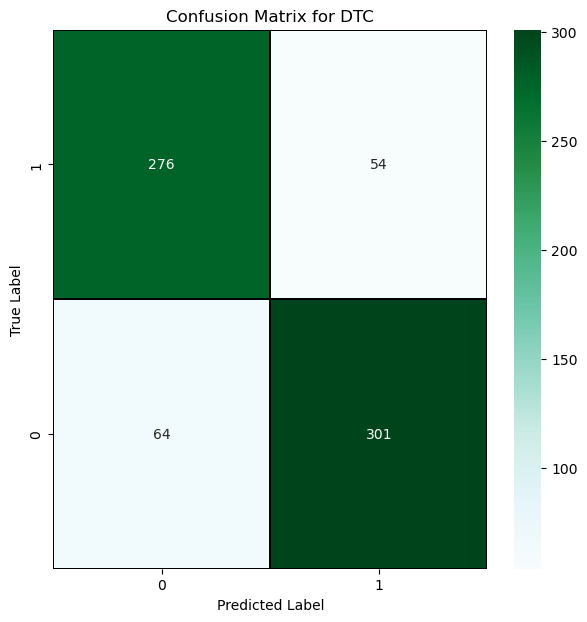

In [115]:
# Let's plot confusion_matrix for dtc
cm= confusion_matrix(y_test, preddtc)
x_axis_labels= ["0","1"]
y_axis_labels= ["1","0"]

f, ax= plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot= True, linewidths=.2, linecolor= "black", fmt= ".0f", ax=ax, cmap= "BuGn", xticklabels= x_axis_labels, yticklabels= y_axis_labels)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title('Confusion Matrix for DTC')
plt.show()

## RANDOM FOREST CLASSIFIER

In [118]:
from sklearn.ensemble import RandomForestClassifier
rfc= RandomForestClassifier()
rfc.fit(x_train, y_train)

# Prediction
predrfc= rfc.predict(x_test)
print(accuracy_score(y_test, predrfc))
print(confusion_matrix(y_test, predrfc))
print(classification_report(y_test, predrfc))

0.9079136690647482
[[316  14]
 [ 50 315]]
              precision    recall  f1-score   support

           0       0.86      0.96      0.91       330
           1       0.96      0.86      0.91       365

    accuracy                           0.91       695
   macro avg       0.91      0.91      0.91       695
weighted avg       0.91      0.91      0.91       695



The accuracy using Random Forest Classifier is 91%

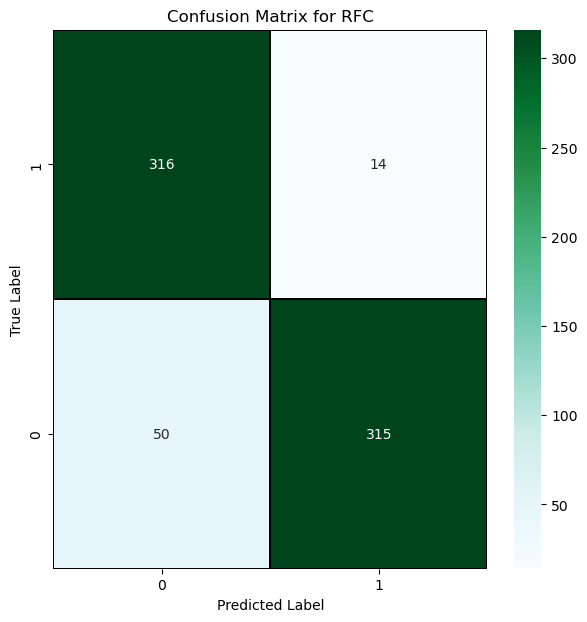

In [119]:
# Let's plot confusion_matrix for rfc
cm= confusion_matrix(y_test, predrfc)
x_axis_labels= ["0","1"]
y_axis_labels= ["1","0"]

f, ax= plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot= True, linewidths=.2, linecolor= "black", fmt= ".0f", ax=ax, cmap= "BuGn", xticklabels= x_axis_labels, yticklabels= y_axis_labels)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title('Confusion Matrix for RFC')
plt.show()

## LOGISTIC REGRESSION

In [120]:
lg= LogisticRegression()
lg.fit(x_train, y_train)

# Prediction
predlg= lg.predict(x_test)
print(accuracy_score(y_test, predlg))
print(confusion_matrix(y_test, predlg))
print(classification_report(y_test, predlg))

0.818705035971223
[[276  54]
 [ 72 293]]
              precision    recall  f1-score   support

           0       0.79      0.84      0.81       330
           1       0.84      0.80      0.82       365

    accuracy                           0.82       695
   macro avg       0.82      0.82      0.82       695
weighted avg       0.82      0.82      0.82       695



The accuracy using Logistic Regression is 82%

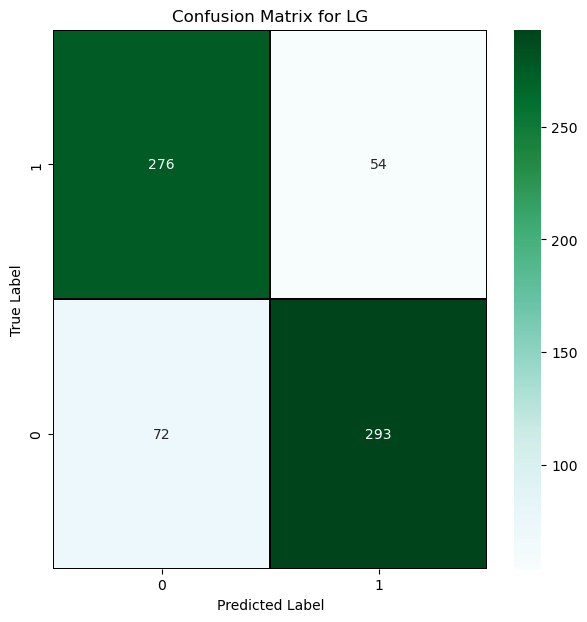

In [121]:
# Let's plot confusion_matrix for lg
cm= confusion_matrix(y_test, predlg)
x_axis_labels= ["0","1"]
y_axis_labels= ["1","0"]

f, ax= plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot= True, linewidths=.2, linecolor= "black", fmt= ".0f", ax=ax, cmap= "BuGn", xticklabels= x_axis_labels, yticklabels= y_axis_labels)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title('Confusion Matrix for LG')
plt.show()

## SVM CLASSIFIER

In [123]:
from sklearn.svm import SVC
svc= SVC()
svc.fit(x_train, y_train)

# Prediction
predsvc= svc.predict(x_test)
print(accuracy_score(y_test, predsvc))
print(confusion_matrix(y_test, predsvc))
print(classification_report(y_test, predsvc))

0.8776978417266187
[[293  37]
 [ 48 317]]
              precision    recall  f1-score   support

           0       0.86      0.89      0.87       330
           1       0.90      0.87      0.88       365

    accuracy                           0.88       695
   macro avg       0.88      0.88      0.88       695
weighted avg       0.88      0.88      0.88       695



The accuracy using SVC is 88%

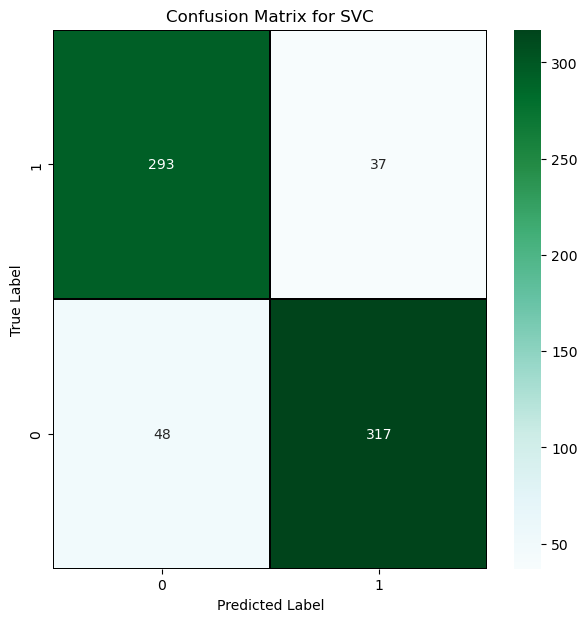

In [124]:
# Let's plot confusion_matrix for svc
cm= confusion_matrix(y_test, predsvc)
x_axis_labels= ["0","1"]
y_axis_labels= ["1","0"]

f, ax= plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot= True, linewidths=.2, linecolor= "black", fmt= ".0f", ax=ax, cmap= "BuGn", xticklabels= x_axis_labels, yticklabels= y_axis_labels)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title('Confusion Matrix for SVC')
plt.show()

## KNEIGHBORS CLASSIFIER

In [126]:
from sklearn.neighbors import KNeighborsClassifier
knn= KNeighborsClassifier()
knn.fit(x_train, y_train)

# Prediction
predknn= knn.predict(x_test)
print(accuracy_score(y_test, predknn))
print(confusion_matrix(y_test, predknn))
print(classification_report(y_test, predknn))

0.8129496402877698
[[215 115]
 [ 15 350]]
              precision    recall  f1-score   support

           0       0.93      0.65      0.77       330
           1       0.75      0.96      0.84       365

    accuracy                           0.81       695
   macro avg       0.84      0.81      0.81       695
weighted avg       0.84      0.81      0.81       695



The accuracy using KNeighbors Classifier is 81%

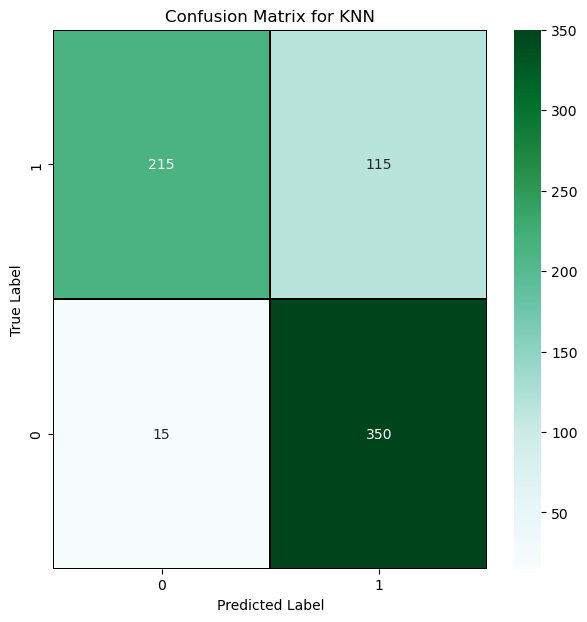

In [127]:
# Let's plot confusion_matrix for knn
cm= confusion_matrix(y_test, predknn)
x_axis_labels= ["0","1"]
y_axis_labels= ["1","0"]

f, ax= plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot= True, linewidths=.2, linecolor= "black", fmt= ".0f", ax=ax, cmap= "BuGn", xticklabels= x_axis_labels, yticklabels= y_axis_labels)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title('Confusion Matrix for KNN')
plt.show()

## GRADIENT BOOSTING CLASSIFIER

In [128]:
from sklearn.ensemble import GradientBoostingClassifier
gbc= GradientBoostingClassifier()
gbc.fit(x_train, y_train)

# Prediction
predgbc= gbc.predict(x_test)
print(accuracy_score(y_test, predgbc))
print(confusion_matrix(y_test, predgbc))
print(classification_report(y_test, predgbc))

0.897841726618705
[[307  23]
 [ 48 317]]
              precision    recall  f1-score   support

           0       0.86      0.93      0.90       330
           1       0.93      0.87      0.90       365

    accuracy                           0.90       695
   macro avg       0.90      0.90      0.90       695
weighted avg       0.90      0.90      0.90       695



The accuracy using Gradient Boosting Classifier is 90%

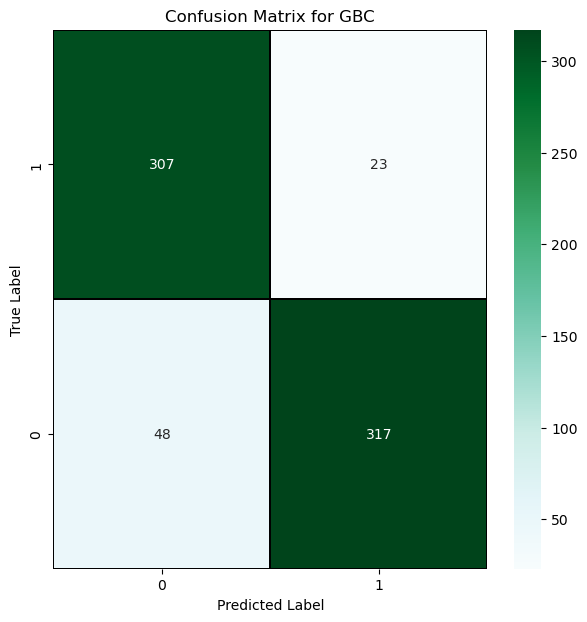

In [129]:
# Let's plot confusion_matrix for gbc
cm= confusion_matrix(y_test, predgbc)
x_axis_labels= ["0","1"]
y_axis_labels= ["1","0"]

f, ax= plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot= True, linewidths=.2, linecolor= "black", fmt= ".0f", ax=ax, cmap= "BuGn", xticklabels= x_axis_labels, yticklabels= y_axis_labels)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title('Confusion Matrix for GBC')
plt.show()

## ADA BOOST CLASSIFIER

In [130]:
from sklearn.ensemble import AdaBoostClassifier
ada= AdaBoostClassifier()
ada.fit(x_train, y_train)

# Prediction
predada= ada.predict(x_test)
print(accuracy_score(y_test, predada))
print(confusion_matrix(y_test, predada))
print(classification_report(y_test, predada))

0.8906474820143885
[[297  33]
 [ 43 322]]
              precision    recall  f1-score   support

           0       0.87      0.90      0.89       330
           1       0.91      0.88      0.89       365

    accuracy                           0.89       695
   macro avg       0.89      0.89      0.89       695
weighted avg       0.89      0.89      0.89       695



The accuracy using Ada Boost Classifier is 89%

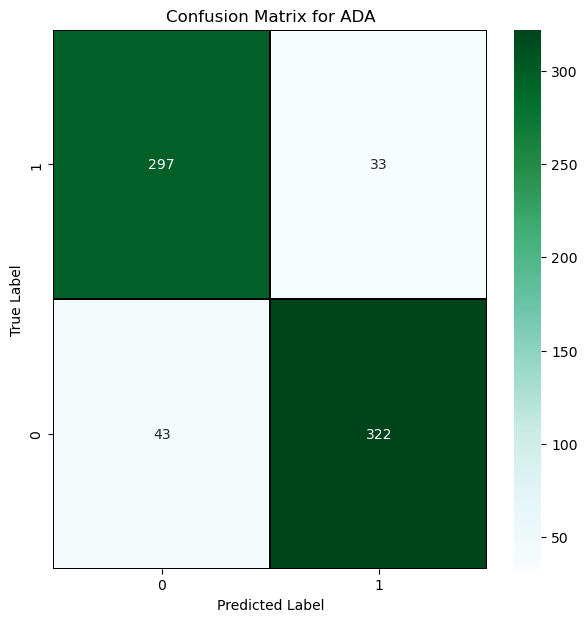

In [131]:
# Let's plot confusion_matrix for ada
cm= confusion_matrix(y_test, predada)
x_axis_labels= ["0","1"]
y_axis_labels= ["1","0"]

f, ax= plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot= True, linewidths=.2, linecolor= "black", fmt= ".0f", ax=ax, cmap= "BuGn", xticklabels= x_axis_labels, yticklabels= y_axis_labels)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title('Confusion Matrix for ADA')
plt.show()

### Checking Cross Validation Score

In [132]:
# CV for dtc
print(cross_val_score(dtc,x,y,cv=5).mean())

0.8148460192150144


In [133]:
# CV for rfc
print(cross_val_score(rfc,x,y,cv=5).mean())

0.8960583153347732


In [134]:
# CV for lg
print(cross_val_score(lg,x,y,cv=5).mean())

0.8092071944589261


In [135]:
# CV for svc
print(cross_val_score(svc,x,y,cv=5).mean())

0.8627746332017576


In [136]:
# CV for knn
print(cross_val_score(knn,x,y,cv=5).mean())

0.8247086095181352


In [137]:
# CV for gbc
print(cross_val_score(gbc,x,y,cv=5).mean())

0.8705993520518358


In [138]:
# CV for ada
print(cross_val_score(ada,x,y,cv=5).mean())

0.8451096670887018


## HYPERPARAMETER TUNING

In [139]:
# KNN Classifier
parameters= {'n_neighbors':[2,3,4,5,6],
            'weights':['uniform','distance'],
            'leaf_size':[10,100],
            'algorithm':['auto','ball_tree','kd_tree','brute']}

In [142]:
gcv= GridSearchCV(KNeighborsClassifier(), parameters, cv=5)

In [143]:
gcv.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'leaf_size': [10, 100], 'n_neighbors': [2, 3, 4, 5, 6],
                         'weights': ['uniform', 'distance']})

In [144]:
gcv.best_params_

{'algorithm': 'auto', 'leaf_size': 10, 'n_neighbors': 2, 'weights': 'uniform'}

In [146]:
Attrition= KNeighborsClassifier(algorithm= 'auto', leaf_size= 10, n_neighbors= 2, weights= 'uniform')
Attrition.fit(x_train, y_train)
pred= Attrition.predict(x_test)
acc= accuracy_score(y_test, pred)
print(acc*100)

88.92086330935251


### PLOTTING ROC

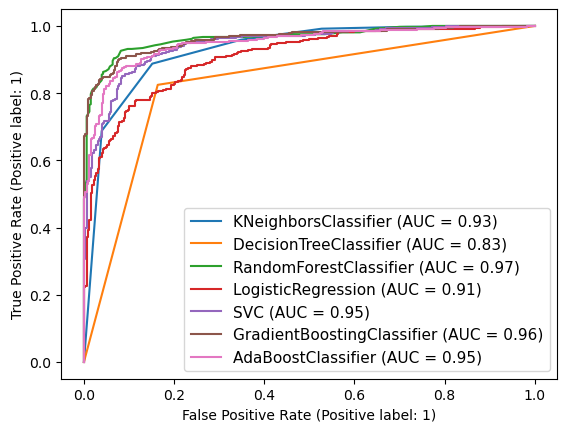

In [150]:
disp= plot_roc_curve(knn,x_test,y_test)
plot_roc_curve(dtc, x_test, y_test, ax= disp.ax_)
plot_roc_curve(rfc, x_test, y_test, ax= disp.ax_)
plot_roc_curve(lg, x_test, y_test, ax= disp.ax_)
plot_roc_curve(svc, x_test, y_test, ax= disp.ax_)
plot_roc_curve(gbc, x_test, y_test, ax= disp.ax_)
plot_roc_curve(ada, x_test, y_test, ax= disp.ax_)

plt.legend(prop= {'size':11}, loc='lower right') 
plt.show()

This is the AUC-ROC curve for the models that we have used and is plotted False positive rate against True positive rate.

### Saving the Model

In [151]:
import joblib
joblib.dump(Attrition, "HR analytics_understanding_the_attrition_in_HR.pkl")

['HR analytics_understanding_the_attrition_in_HR.pkl']

### Predicted the Saved Model

In [152]:
# let's load the saved model and get the prediction

model= joblib.load("HR analytics_understanding_the_attrition_in_HR.pkl")

# Prediction
prediction= model.predict(x_test)
prediction

array([0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1,
       1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0,
       0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1,
       1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0,
       0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0,
       1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1,
       1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0,
       1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1,
       1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1,
       0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1,

In [153]:
pd.DataFrame([model.predict(x_test)[:], y_test[:]], index= ["Predicted", "Original"])

,0,1,2,3,4,5,6,7,8,9,...,685,686,687,688,689,690,691,692,693,694
Predicted,0,1,0,1,1,0,1,1,1,0,...,1,0,1,0,0,1,1,1,0,1
Original,0,1,0,1,1,0,1,1,1,0,...,1,0,1,0,0,1,1,1,0,1
